In [22]:
#v2: plotting loss table and dump it

In [23]:
#https://towardsdatascience.com/demystifying-gans-in-tensorflow-2-0-9890834ab3d9

#der untere ist meine Vorlage
#https://becominghuman.ai/image-classification-with-tensorflow-2-0-without-keras-e6534adddab2

In [24]:
import tensorflow as tf

In [25]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"  # Or 2, 3, etc. other than 0

In [26]:
#set parameters
save_folder = "PTF_2"

train_on_folder = False
train_data_path = "/eos/home-f/frehm/TF2/Data/EleEscan_1_1/EleEscan_1_1.h5" #file
train_folder_path = "/eos/home-f/frehm/TF2/Data//"     #there has to be a folder inside

learning_rate = 0.01
#optimizer = tf.optimizers.Adam(0.001)
nb_epochs = 100
percent = 100          #take just 10 percent of all data for training and testing
latent_size = 200
batch_size =  64       #128     #batch_size must be less or equal test size, otherwise error
keras_dformat = 'channels_first'    #last for CPU, first for GPU
from PTF_models_v2 import *
from Functions_v1 import *

In [27]:
#initialize weights 

initializer = tf.initializers.glorot_uniform()
#initializer = tf.compat.v1.keras.initializers.he_uniform(seed=None)

def get_weight( shape , name ):
    return tf.Variable( initializer( shape ) , name=name , trainable=True , dtype=tf.float32 )

gen_weights = [
    [200, 625],
    [5, 5, 5, 5, 64],     #conv1  shape=[f1,f2,f3,in_channel, out_channel] 
    [1, 64, 1, 1, 1],     #batch offset
    [1, 64, 1, 1, 1],     #batch scale
    [5, 5, 5, 32, 64],    #conv_transpose1 [f1,f2,f3,out,in]
    [5, 5, 5, 32, 16],    #conv2
    [1, 16, 1, 1, 1],     #batch offset
    [1, 16, 1, 1, 1],     #batch scale
    [5, 5, 5, 32, 16],    #trans2
    [4, 4, 4, 32, 32],    #conv3
    [1, 32, 1, 1, 1],     #batch offset
    [1, 32, 1, 1, 1],     #batch scale
    [3, 3, 3, 32, 32],    #conv4
    [1, 32, 1, 1, 1],     #batch offset
    [1, 32, 1, 1, 1],     #batch scale
    [1, 1, 1, 32, 1]      #conv_out
]

g_weights = []
for i in range( len( gen_weights ) ):
    g_weights.append( get_weight( gen_weights[ i ] , 'weight{}'.format( i ) ) )

disc_weights = [
    [5, 5, 5, 1, 32],    #conv1  shape=[f1,f2,f3,in_channel, out_channel] data_format="NCDHW"
    [5, 5, 5, 32, 32],   #conv2
    [1, 32, 1, 1, 1],     #batch offset
    [1, 32, 1, 1, 1],     #batch scale
    [5, 5, 5, 32, 16],   #conv3
    [1, 16, 1, 1, 1],     #batch offset
    [1, 16, 1, 1, 1],     #batch scale
    [5, 5, 5, 16, 16],   #conv4
    [1, 16, 1, 1, 1],     #batch offset
    [1, 16, 1, 1, 1],     #batch scale
    [21296, 1],         #dense shape=[in_connections, out_connections]
    [21296, 1]
]

d_weights = []
for i in range( len( disc_weights ) ):
    d_weights.append( get_weight( disc_weights[ i ] , 'weight{}'.format( i ) ) )


In [28]:
#reinitialize the batch norm weights: beta to zeros and gammas to ones
g_weights[2] = tf.Variable(tf.zeros_like(g_weights[2]),trainable=True)
g_weights[3] =  tf.Variable(tf.ones_like(g_weights[3]),trainable=True)
g_weights[6] = tf.Variable(tf.zeros_like(g_weights[6]),trainable=True)
g_weights[7] =  tf.Variable(tf.ones_like(g_weights[7]),trainable=True)
g_weights[10] = tf.Variable(tf.zeros_like(g_weights[10]),trainable=True)
g_weights[11] =  tf.Variable(tf.ones_like(g_weights[11]),trainable=True)
g_weights[13] = tf.Variable(tf.zeros_like(g_weights[13]),trainable=True)
g_weights[14] =  tf.Variable(tf.ones_like(g_weights[14]),trainable=True)

d_weights[2] = tf.Variable(tf.zeros_like(d_weights[2]),trainable=True)
d_weights[3] =  tf.Variable(tf.ones_like(d_weights[3]),trainable=True)
d_weights[5] = tf.Variable(tf.zeros_like(d_weights[5]),trainable=True)
d_weights[6] =  tf.Variable(tf.ones_like(d_weights[6]),trainable=True)
d_weights[8] = tf.Variable(tf.zeros_like(d_weights[8]),trainable=True)
d_weights[9] =  tf.Variable(tf.ones_like(d_weights[9]),trainable=True)

In [29]:
#test networks

inp = tf.Variable(tf.random.normal([2,200]))
#print(inp.numpy())
out = generator(inp, g_weights)
#print(out)

inp = tf.Variable(tf.random.normal([2,1,25,25,25]))
#print(inp.shape)
out = (discriminator(inp, g_weights, d_weights))
#print(out)

inp = tf.Variable(tf.random.normal([2,200]))
#print(inp.numpy())
out = combined(inp, g_weights, d_weights)
#print(out)

In [30]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-

from __future__ import print_function
from collections import defaultdict
try:
    import cPickle as pickle
except ImportError:
    import pickle
import argparse
import os
from six.moves import range
import sys
import h5py 
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
import matplotlib.pyplot as plt
import time


In [31]:
#import trainingsdata
X, y = import_data(train_on_folder, train_data_path, train_folder_path)
print('*************************************************************************************') 

#create output folders for saving files and weights
create_folder(save_folder+'/')
create_folder(save_folder+'/Weights/')
create_folder(save_folder+'/Weights/disc')
create_folder(save_folder+'/Weights/gen')
create_folder(save_folder+'/Pickle/')
create_folder(save_folder+'/Save_Images/')
print('*************************************************************************************')

#do data preperation    
X_train, X_test, y_train, y_test, ecal_train, ecal_test, nb_train, nb_test = data_preperation(X, y, keras_dformat, batch_size, percent)
#converte to tensors
X_train = tf.constant(X_train)
X_test  = tf.constant(X_test)
y_train = tf.constant(y_train)
y_test  = tf.constant(y_test)
ecal_train = tf.constant(ecal_train)
ecal_test  = tf.constant(ecal_test)
print("X_train_shape: ", X_train.shape)
print("X_test_shape: ", X_test.shape)
print("ecal_train_shape: ", ecal_train.shape)
print("ecal_test_shape: ", ecal_test.shape)
print('*************************************************************************************')


X_Shape (Imported Data):  (10000, 25, 25, 25)
Länge y:  10000
*************************************************************************************
Directory  PTF_2/  Created 
Directory  PTF_2/Weights/  Created 
Directory  PTF_2/Weights/disc  Created 
Directory  PTF_2/Weights/gen  Created 
Directory  PTF_2/Pickle/  Created 
Directory  PTF_2/Save_Images/  Created 
*************************************************************************************
X_train_shape:  (9000, 1, 25, 25, 25)
X_test_shape:  (1000, 1, 25, 25, 25)
ecal_train_shape:  (9000, 1)
ecal_test_shape:  (1000, 1)
*************************************************************************************


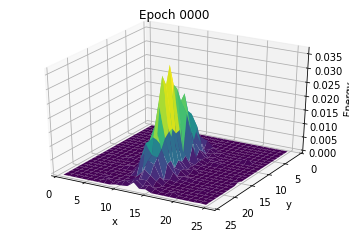

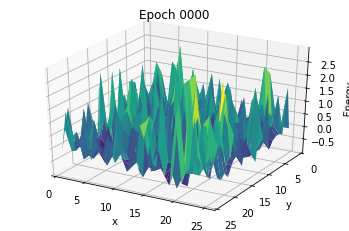

In [32]:
#plots during training

#%matplotlib notebook            #this is for 3D projection
epoch=0

#function for plotting a training images
plot_images(X, epoch, save_folder, save=False, number=1)

def plot_gen_image_tf(latent_size, g_weights):   #generate a image 
    tf.random.set_seed(1)     
    noise, gen_aux, generator_input, gen_ecal = func_for_gen_tf(1,latent_size=latent_size)
    tf.random.set_seed(None)
    generated_images = generator(generator_input, g_weights)
    generated_images = np.squeeze(generated_images, axis=(1,))
    Xgen = generated_images
    plot_images(Xgen, epoch, save_folder, save=True, number=1)
    return

plot_gen_image_tf(latent_size, g_weights)

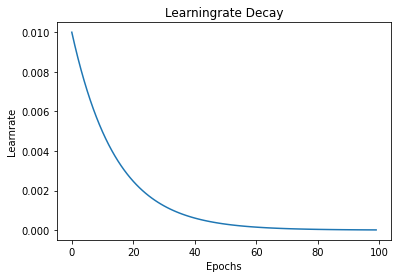

lr last value:  1e-05


In [33]:
#learningrate decay
from math import *
def l_dec(epoch):
    initial_lrate = learning_rate
    k = 0.07
    lrate = initial_lrate * exp(-k*epoch)
    return lrate

ep_list=[]
lr_list=[]
for i in range(0,100):
    ep_list.append(i)
    lr_list.append(l_dec(i))

plt.plot(ep_list,lr_list)
plt.title("Learningrate Decay")
plt.xlabel("Epochs")
plt.ylabel("Learnrate")
plt.show()
print("lr last value: ", round(lr_list[-1],5))

Number of Batches:  140
Epoch 2 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 1478.00 | 72.70           | 47.28| 1358.02
generator (test)       | 356.48 | 49.33           | 33.46| 273.69
discriminator (train)  | 742.12 | 13.15           | 77.59| 651.38
discriminator (test)   | 173.03 | 7.52            | 27.42| 138.09


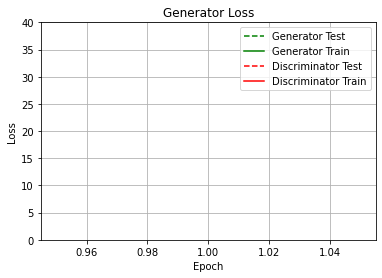

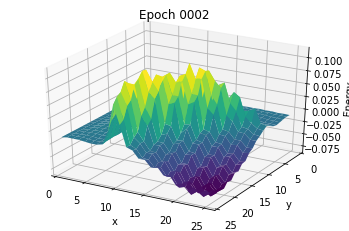

Epoch 3 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 168.68 | 38.35           | 19.92| 110.42
generator (test)       | 77.62 | 32.98           | 8.65 | 35.99
discriminator (train)  | 89.85 | 6.08            | 27.61| 56.17
discriminator (test)   | 33.81 | 3.40            | 12.42| 17.99


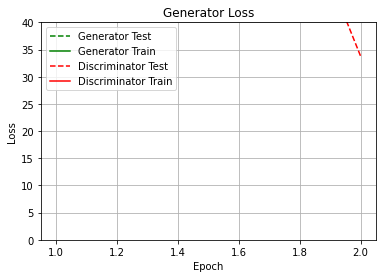

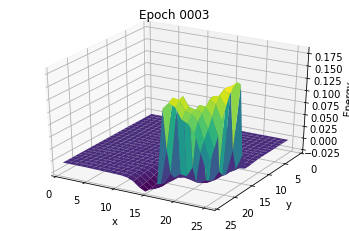

Epoch 4 of 100
140/140 [==============================] - 166s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 91.64 | 19.70           | 9.79 | 62.16
generator (test)       | 64.73 | 17.63           | 7.68 | 39.42
discriminator (train)  | 48.15 | 2.89            | 14.64| 30.62
discriminator (test)   | 34.60 | 2.47            | 11.22| 20.90


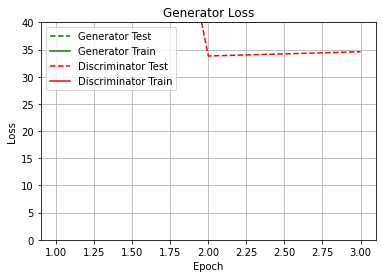

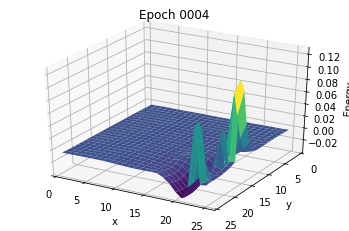

Epoch 5 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 88.15 | 13.36           | 7.85 | 66.94
generator (test)       | 58.30 | 12.68           | 6.99 | 38.63
discriminator (train)  | 49.27 | 2.31            | 12.50| 34.45
discriminator (test)   | 33.36 | 2.38            | 10.94| 20.04


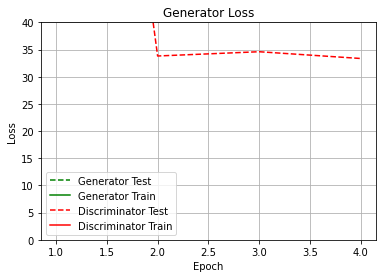

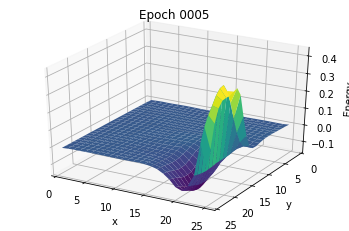

Epoch 6 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 74.27 | 12.84           | 7.19 | 54.25
generator (test)       | 40.88 | 10.14           | 6.44 | 24.30
discriminator (train)  | 41.29 | 2.19            | 11.55| 27.55
discriminator (test)   | 24.12 | 2.06            | 10.63| 11.43


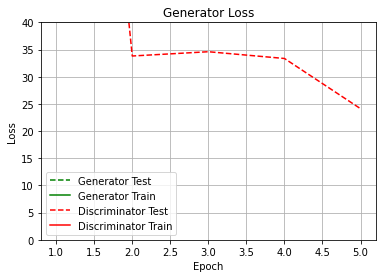

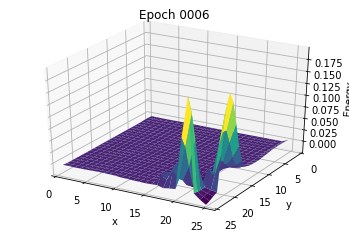

Epoch 7 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 39.56 | 12.77           | 6.75 | 20.03
generator (test)       | 31.92 | 14.67           | 6.58 | 10.66
discriminator (train)  | 23.29 | 2.16            | 11.17| 9.96 
discriminator (test)   | 18.14 | 2.11            | 10.85| 5.18 


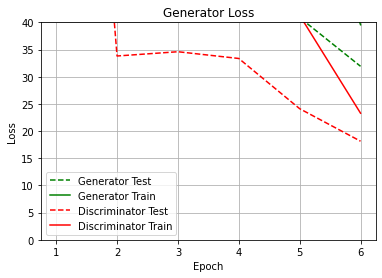

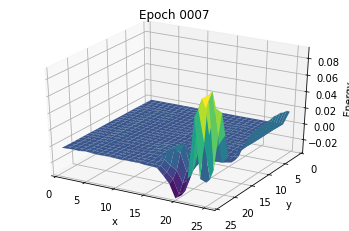

Epoch 8 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 34.38 | 13.13           | 6.32 | 14.92
generator (test)       | 28.74 | 14.93           | 6.14 | 7.67 
discriminator (train)  | 20.07 | 2.12            | 10.99| 6.96 
discriminator (test)   | 16.58 | 2.15            | 10.59| 3.84 


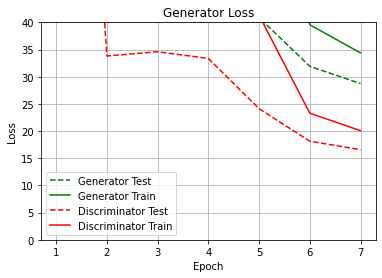

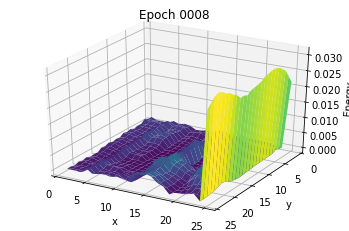

Epoch 9 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 31.72 | 13.02           | 5.91 | 12.79
generator (test)       | 39.11 | 22.21           | 5.06 | 11.84
discriminator (train)  | 19.33 | 2.12            | 10.72| 6.49 
discriminator (test)   | 18.45 | 2.62            | 9.90 | 5.93 


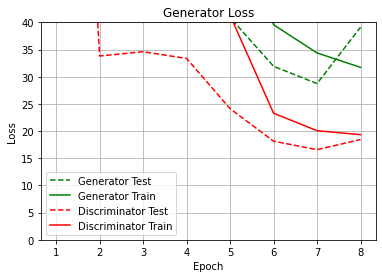

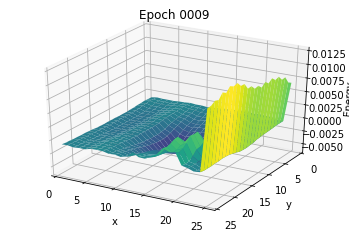

Epoch 10 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 30.04 | 13.38           | 5.56 | 11.10
generator (test)       | 28.44 | 18.48           | 5.29 | 4.67 
discriminator (train)  | 18.55 | 2.21            | 10.79| 5.55 
discriminator (test)   | 15.19 | 2.13            | 10.24| 2.82 


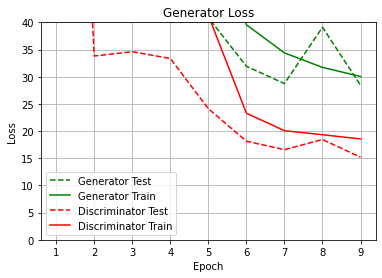

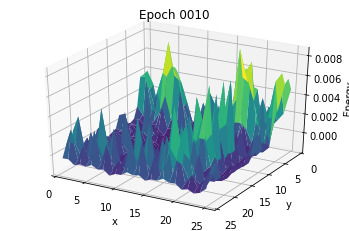

Epoch 11 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 26.93 | 13.19           | 5.81 | 7.93 
generator (test)       | 18.32 | 7.58            | 4.83 | 5.91 
discriminator (train)  | 17.75 | 2.67            | 11.16| 3.91 
discriminator (test)   | 15.65 | 2.61            | 10.44| 2.59 


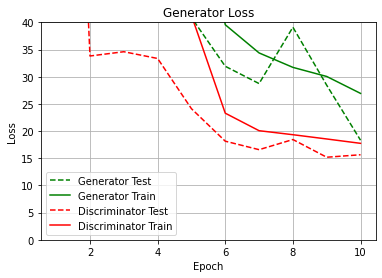

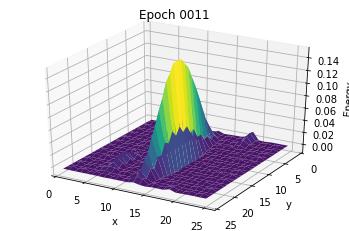

Epoch 12 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 24.81 | 12.85           | 4.67 | 7.29 
generator (test)       | 35.49 | 17.76           | 6.44 | 11.30
discriminator (train)  | 16.86 | 2.54            | 10.49| 3.84 
discriminator (test)   | 19.71 | 2.57            | 10.77| 6.37 


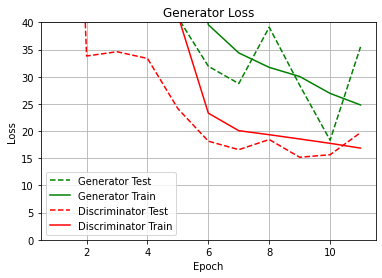

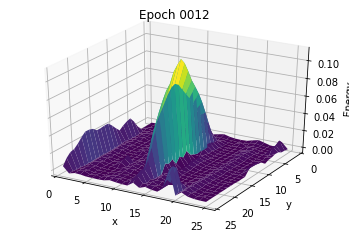

Epoch 13 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 25.75 | 14.15           | 3.98 | 7.62 
generator (test)       | 31.69 | 26.11           | 3.45 | 2.13 
discriminator (train)  | 16.16 | 2.21            | 9.98 | 3.97 
discriminator (test)   | 12.64 | 2.33            | 9.20 | 1.10 


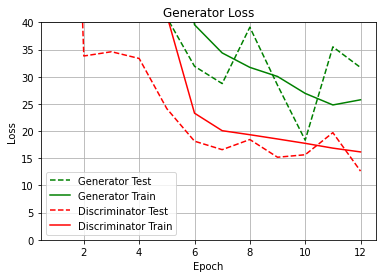

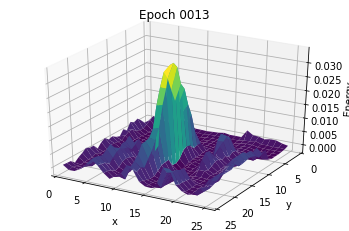

Epoch 14 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 22.92 | 13.17           | 3.68 | 6.07 
generator (test)       | 23.12 | 11.82           | 3.10 | 8.21 
discriminator (train)  | 15.06 | 2.22            | 9.90 | 2.94 
discriminator (test)   | 15.58 | 2.25            | 9.05 | 4.28 


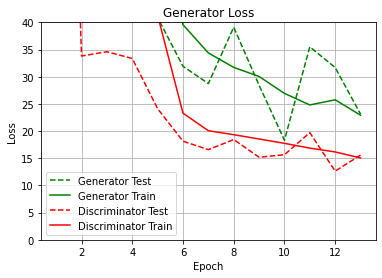

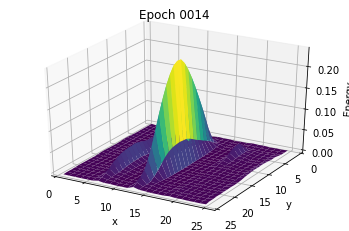

Epoch 15 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 21.74 | 12.00           | 3.33 | 6.42 
generator (test)       | 20.13 | 12.44           | 3.80 | 3.90 
discriminator (train)  | 15.71 | 2.51            | 9.95 | 3.25 
discriminator (test)   | 13.24 | 1.93            | 9.42 | 1.89 


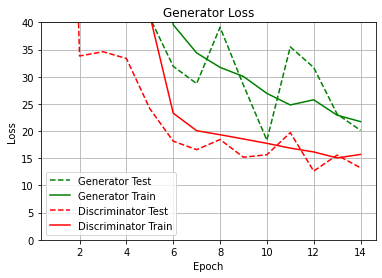

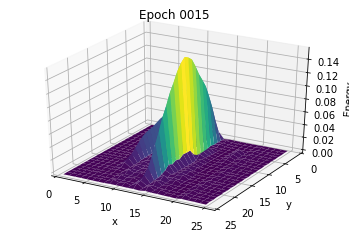

Epoch 16 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 19.96 | 11.78           | 3.96 | 4.23 
generator (test)       | 18.87 | 12.40           | 2.98 | 3.50 
discriminator (train)  | 15.40 | 2.86            | 10.47| 2.07 
discriminator (test)   | 17.70 | 4.14            | 11.76| 1.79 


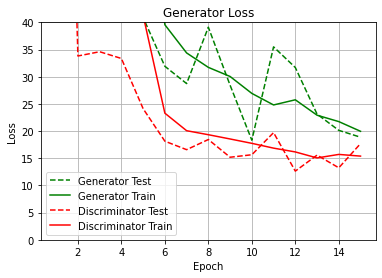

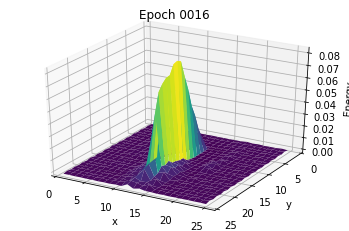

Epoch 17 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 20.23 | 11.50           | 4.01 | 4.72 
generator (test)       | 37.69 | 25.10           | 3.05 | 9.55 
discriminator (train)  | 16.33 | 2.93            | 11.01| 2.39 
discriminator (test)   | 16.49 | 2.45            | 9.36 | 4.68 


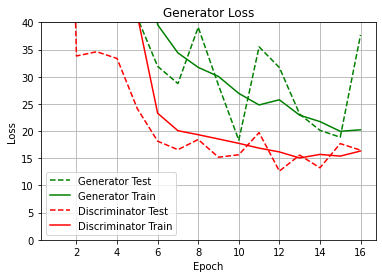

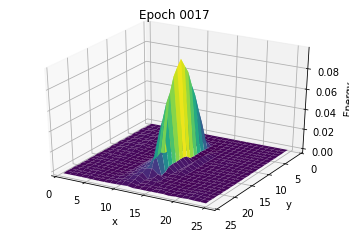

Epoch 18 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 20.00 | 13.65           | 3.13 | 3.22 
generator (test)       | 15.03 | 11.34           | 1.93 | 1.76 
discriminator (train)  | 13.84 | 2.42            | 9.83 | 1.58 
discriminator (test)   | 11.33 | 2.04            | 8.40 | 0.89 


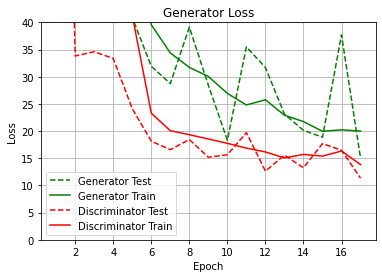

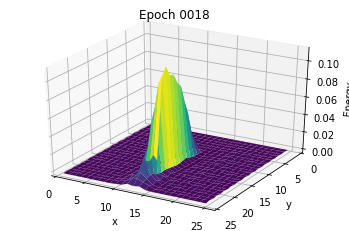

Epoch 19 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 18.60 | 12.52           | 2.97 | 3.10 
generator (test)       | 12.59 | 9.16            | 2.04 | 1.39 
discriminator (train)  | 13.52 | 2.31            | 9.65 | 1.56 
discriminator (test)   | 11.55 | 2.38            | 8.45 | 0.72 


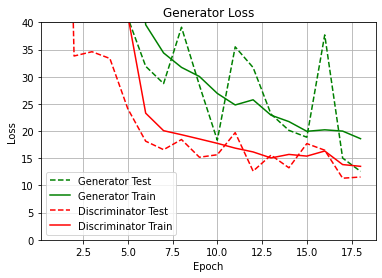

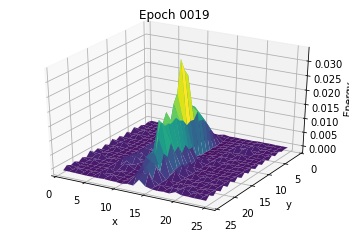

Epoch 20 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 18.47 | 12.95           | 2.61 | 2.91 
generator (test)       | 16.71 | 6.35            | 6.54 | 3.82 
discriminator (train)  | 12.97 | 2.21            | 9.31 | 1.45 
discriminator (test)   | 16.04 | 2.64            | 11.55| 1.85 


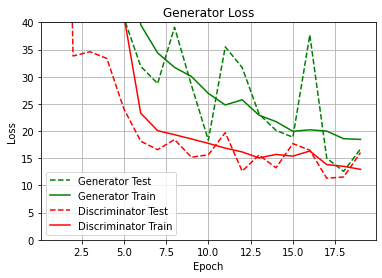

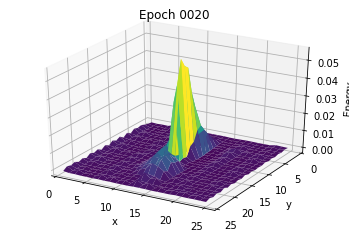

Epoch 21 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 19.36 | 13.14           | 2.72 | 3.49 
generator (test)       | 17.46 | 13.50           | 1.89 | 2.07 
discriminator (train)  | 13.37 | 2.25            | 9.43 | 1.70 
discriminator (test)   | 11.64 | 1.99            | 8.49 | 1.16 


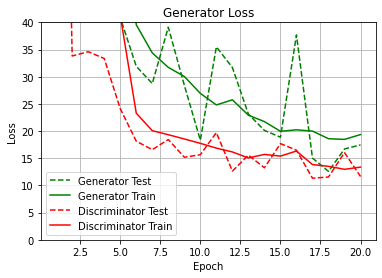

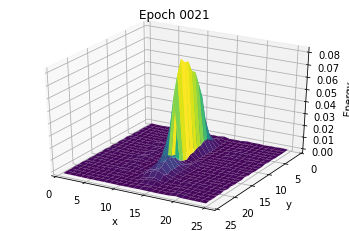

Epoch 22 of 100
140/140 [==============================] - 164s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 17.60 | 12.73           | 2.40 | 2.48 
generator (test)       | 23.24 | 18.00           | 2.83 | 2.41 
discriminator (train)  | 12.33 | 2.07            | 9.03 | 1.23 
discriminator (test)   | 12.16 | 2.16            | 8.75 | 1.25 


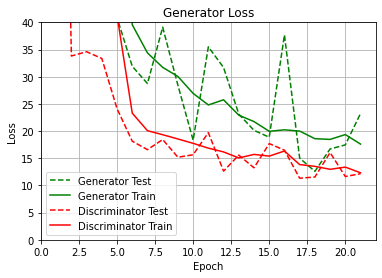

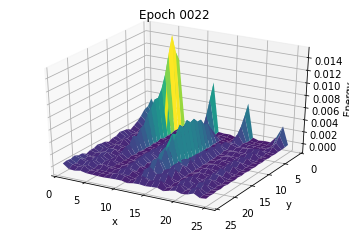

Epoch 23 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 22.55 | 14.57           | 3.63 | 4.35 
generator (test)       | 21.59 | 16.47           | 2.75 | 2.36 
discriminator (train)  | 13.98 | 2.11            | 9.68 | 2.19 
discriminator (test)   | 12.19 | 2.10            | 8.93 | 1.16 


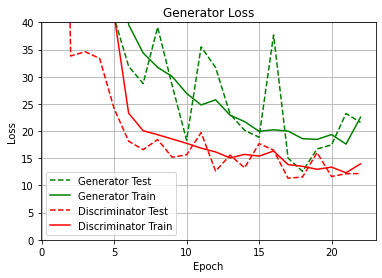

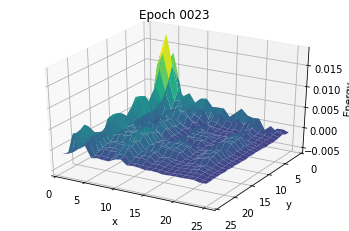

Epoch 24 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 20.01 | 13.74           | 2.72 | 3.55 
generator (test)       | 17.81 | 12.85           | 2.38 | 2.59 
discriminator (train)  | 12.77 | 1.97            | 9.08 | 1.72 
discriminator (test)   | 12.06 | 2.01            | 8.77 | 1.28 


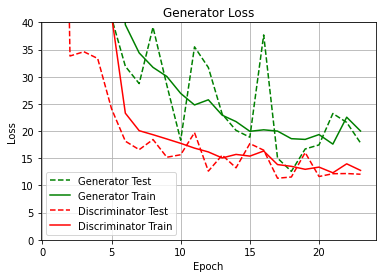

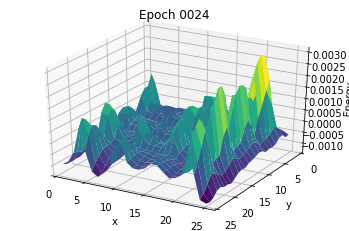

Epoch 25 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 18.04 | 13.32           | 2.41 | 2.31 
generator (test)       | 18.92 | 14.87           | 1.96 | 2.09 
discriminator (train)  | 12.02 | 2.07            | 8.88 | 1.07 
discriminator (test)   | 11.60 | 2.17            | 8.39 | 1.04 


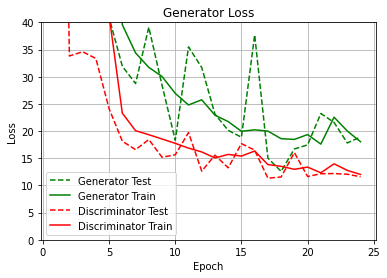

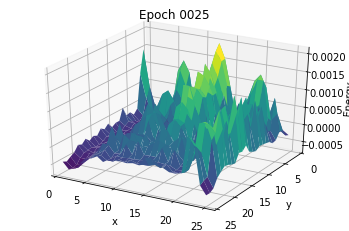

Epoch 26 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 16.64 | 12.45           | 2.34 | 1.86 
generator (test)       | 16.02 | 13.13           | 1.60 | 1.29 
discriminator (train)  | 11.88 | 2.07            | 8.89 | 0.92 
discriminator (test)   | 10.91 | 2.05            | 8.25 | 0.61 


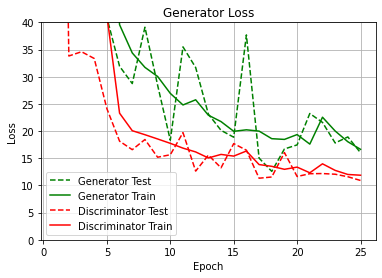

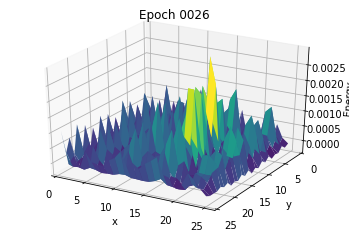

Epoch 27 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.67 | 12.40           | 1.96 | 1.31 
generator (test)       | 14.97 | 10.83           | 1.89 | 2.25 
discriminator (train)  | 11.49 | 2.10            | 8.72 | 0.67 
discriminator (test)   | 11.61 | 2.06            | 8.53 | 1.02 


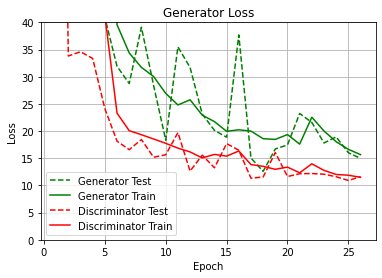

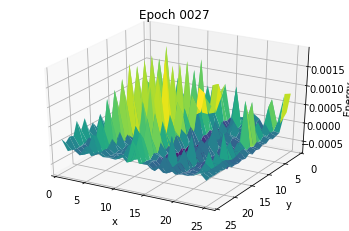

Epoch 28 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.82 | 12.15           | 2.24 | 1.43 
generator (test)       | 16.38 | 12.68           | 2.13 | 1.57 
discriminator (train)  | 11.62 | 2.16            | 8.76 | 0.70 
discriminator (test)   | 11.76 | 2.06            | 8.90 | 0.80 


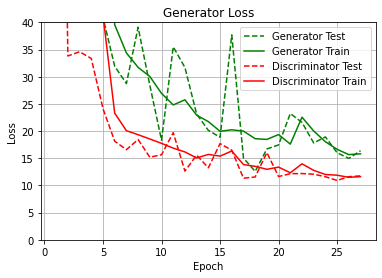

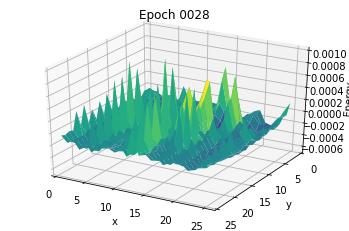

Epoch 29 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.36 | 12.12           | 1.96 | 1.28 
generator (test)       | 15.81 | 13.33           | 1.58 | 0.90 
discriminator (train)  | 11.40 | 2.08            | 8.68 | 0.65 
discriminator (test)   | 10.86 | 1.97            | 8.46 | 0.43 


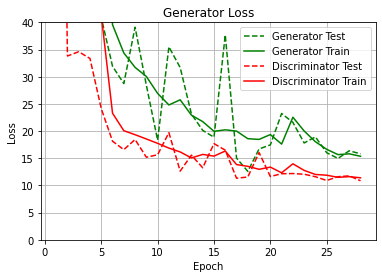

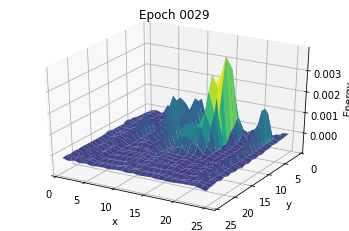

Epoch 30 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.83 | 12.55           | 1.97 | 1.32 
generator (test)       | 14.81 | 11.73           | 1.64 | 1.44 
discriminator (train)  | 11.46 | 2.14            | 8.64 | 0.68 
discriminator (test)   | 11.13 | 2.00            | 8.40 | 0.73 


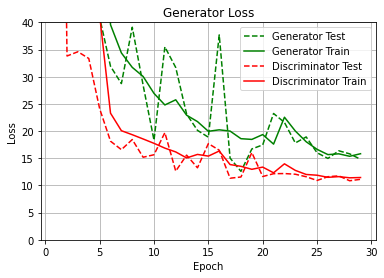

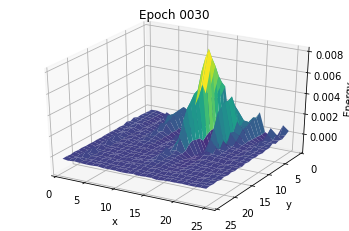

Epoch 31 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.22 | 12.28           | 1.72 | 1.22 
generator (test)       | 13.19 | 10.71           | 1.51 | 0.97 
discriminator (train)  | 11.26 | 2.14            | 8.52 | 0.61 
discriminator (test)   | 10.79 | 2.00            | 8.28 | 0.50 


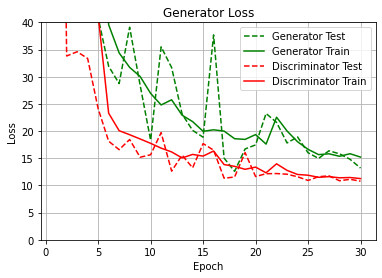

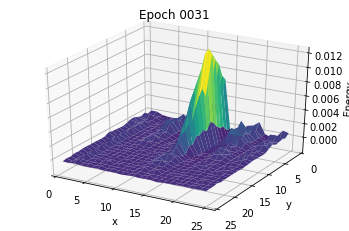

Epoch 32 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 14.94 | 12.00           | 1.69 | 1.26 
generator (test)       | 14.12 | 11.76           | 1.43 | 0.93 
discriminator (train)  | 11.19 | 2.10            | 8.46 | 0.63 
discriminator (test)   | 10.66 | 1.82            | 8.34 | 0.49 


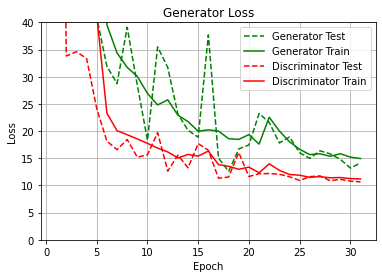

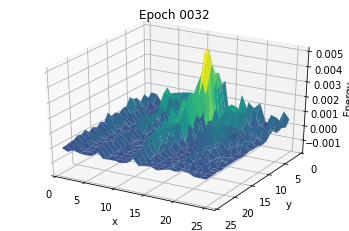

Epoch 33 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.69 | 12.75           | 1.69 | 1.25 
generator (test)       | 16.04 | 13.48           | 1.51 | 1.05 
discriminator (train)  | 11.15 | 2.08            | 8.44 | 0.63 
discriminator (test)   | 10.48 | 1.72            | 8.21 | 0.55 


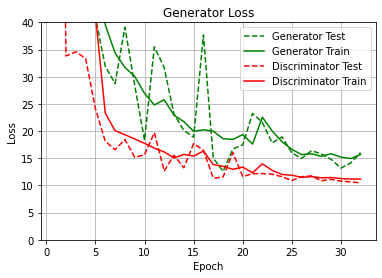

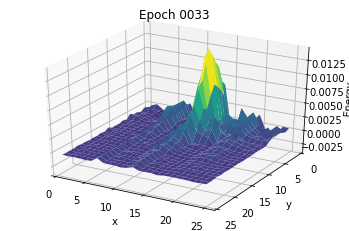

Epoch 34 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.03 | 12.20           | 1.67 | 1.15 
generator (test)       | 14.67 | 11.50           | 1.95 | 1.23 
discriminator (train)  | 11.10 | 2.06            | 8.45 | 0.59 
discriminator (test)   | 11.12 | 2.02            | 8.52 | 0.58 


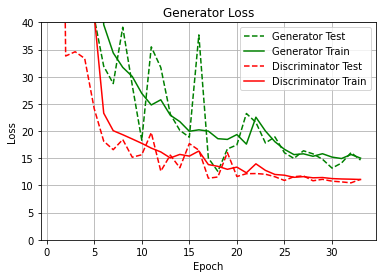

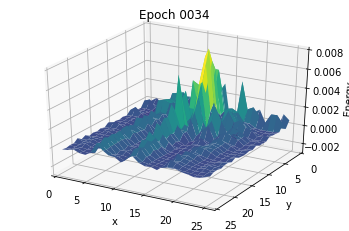

Epoch 35 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.32 | 12.29           | 1.62 | 1.41 
generator (test)       | 13.86 | 10.59           | 1.54 | 1.72 
discriminator (train)  | 11.17 | 2.06            | 8.42 | 0.69 
discriminator (test)   | 11.18 | 2.09            | 8.22 | 0.88 


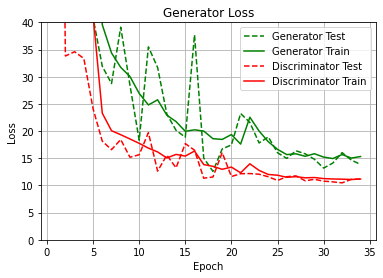

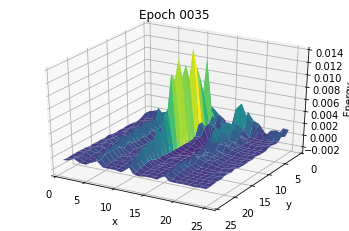

Epoch 36 of 100
140/140 [==============================] - 164s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 16.22 | 12.83           | 1.61 | 1.79 
generator (test)       | 17.00 | 13.38           | 1.57 | 2.05 
discriminator (train)  | 11.39 | 2.06            | 8.43 | 0.90 
discriminator (test)   | 11.37 | 2.08            | 8.24 | 1.05 


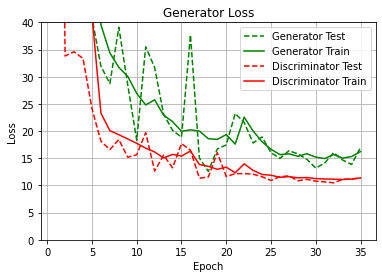

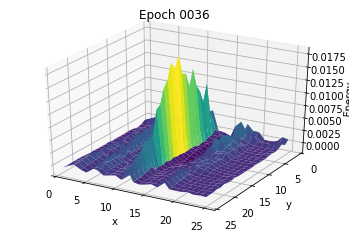

Epoch 37 of 100
140/140 [==============================] - 157s 1s/step
Time for Epoch: 00:02:42
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 16.42 | 12.66           | 1.64 | 2.12 
generator (test)       | 17.98 | 13.58           | 1.85 | 2.55 
discriminator (train)  | 11.58 | 2.07            | 8.46 | 1.06 
discriminator (test)   | 11.83 | 2.05            | 8.46 | 1.32 


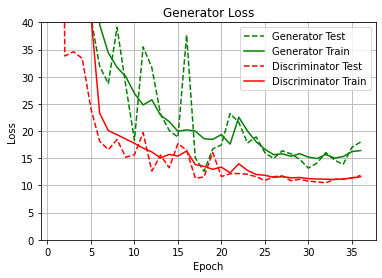

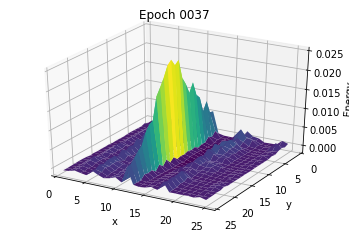

Epoch 38 of 100
140/140 [==============================] - 156s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 16.48 | 12.43           | 1.74 | 2.31 
generator (test)       | 15.60 | 11.71           | 1.70 | 2.19 
discriminator (train)  | 11.77 | 2.10            | 8.52 | 1.15 
discriminator (test)   | 11.40 | 1.92            | 8.34 | 1.13 


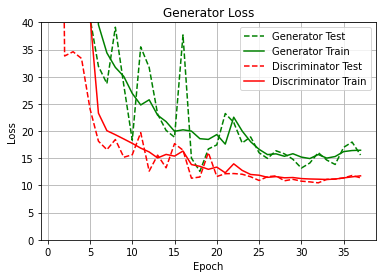

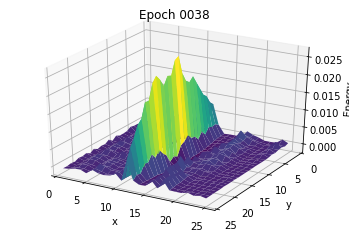

Epoch 39 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:40
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 16.13 | 12.10           | 1.71 | 2.32 
generator (test)       | 17.96 | 13.30           | 1.81 | 2.85 
discriminator (train)  | 11.75 | 2.07            | 8.53 | 1.15 
discriminator (test)   | 11.88 | 2.21            | 8.34 | 1.33 


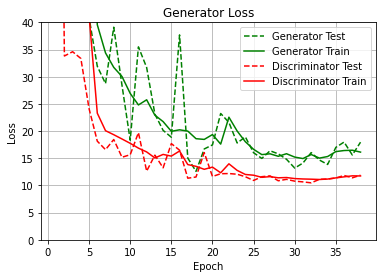

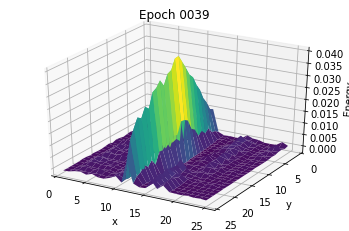

Epoch 40 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:40
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.28 | 11.42           | 1.67 | 2.19 
generator (test)       | 16.86 | 13.11           | 1.87 | 1.88 
discriminator (train)  | 11.77 | 2.19            | 8.48 | 1.09 
discriminator (test)   | 11.63 | 2.25            | 8.46 | 0.92 


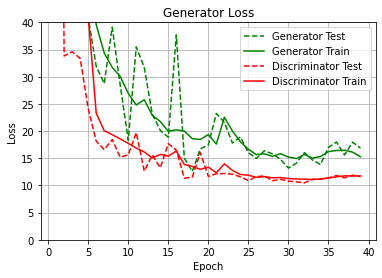

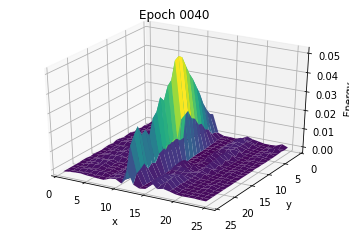

Epoch 41 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.54 | 11.80           | 1.62 | 2.13 
generator (test)       | 15.67 | 11.92           | 1.42 | 2.33 
discriminator (train)  | 11.71 | 2.19            | 8.46 | 1.06 
discriminator (test)   | 11.41 | 2.00            | 8.22 | 1.19 


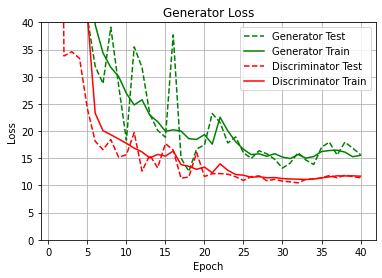

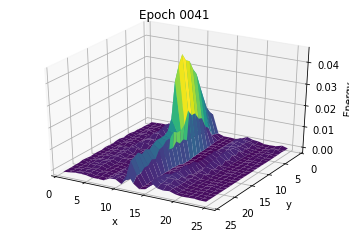

Epoch 42 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 16.48 | 12.43           | 1.60 | 2.45 
generator (test)       | 17.55 | 13.60           | 1.49 | 2.46 
discriminator (train)  | 11.78 | 2.12            | 8.43 | 1.22 
discriminator (test)   | 11.56 | 2.06            | 8.26 | 1.24 


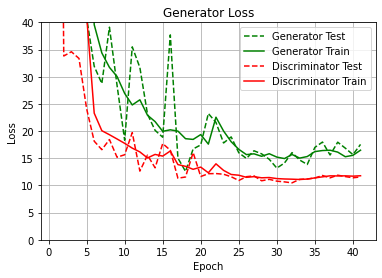

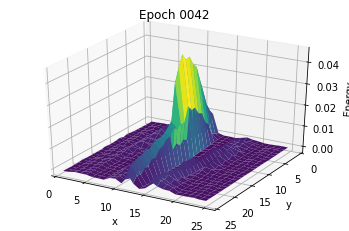

Epoch 43 of 100
140/140 [==============================] - 157s 1s/step
Time for Epoch: 00:02:42
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 16.26 | 12.27           | 1.52 | 2.46 
generator (test)       | 15.57 | 11.81           | 1.37 | 2.38 
discriminator (train)  | 11.63 | 2.06            | 8.34 | 1.23 
discriminator (test)   | 11.35 | 1.91            | 8.23 | 1.22 


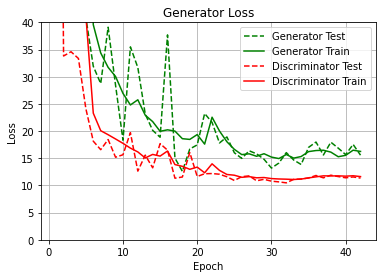

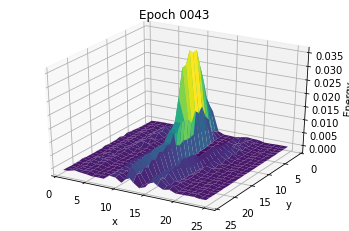

Epoch 44 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:40
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 16.28 | 12.34           | 1.50 | 2.44 
generator (test)       | 15.69 | 12.03           | 1.38 | 2.29 
discriminator (train)  | 11.67 | 2.12            | 8.35 | 1.20 
discriminator (test)   | 11.28 | 2.04            | 8.12 | 1.13 


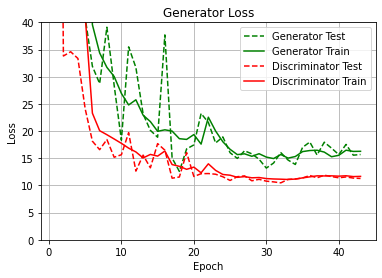

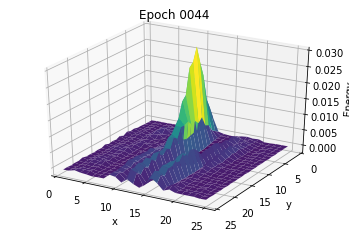

Epoch 45 of 100
140/140 [==============================] - 157s 1s/step
Time for Epoch: 00:02:42
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 16.44 | 12.22           | 1.52 | 2.71 
generator (test)       | 16.92 | 12.43           | 1.64 | 2.86 
discriminator (train)  | 11.76 | 2.07            | 8.34 | 1.35 
discriminator (test)   | 11.83 | 1.94            | 8.41 | 1.48 


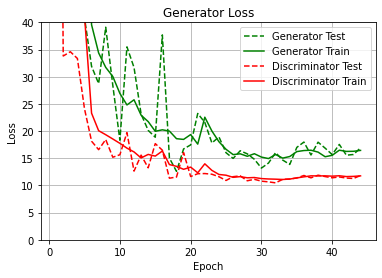

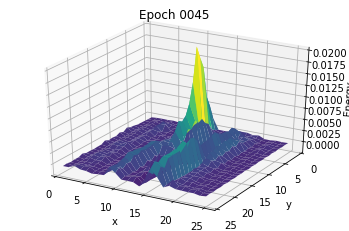

Epoch 46 of 100
140/140 [==============================] - 156s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 16.65 | 12.29           | 1.53 | 2.83 
generator (test)       | 17.75 | 13.00           | 1.51 | 3.24 
discriminator (train)  | 11.75 | 2.01            | 8.33 | 1.41 
discriminator (test)   | 12.00 | 2.10            | 8.34 | 1.56 


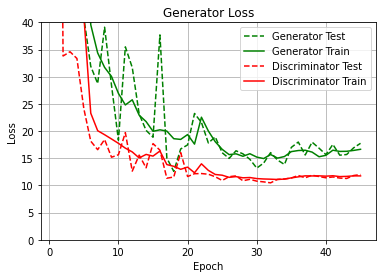

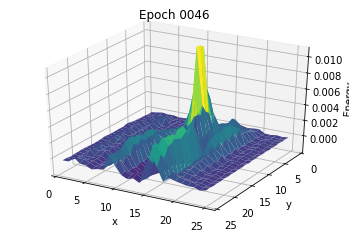

Epoch 47 of 100
140/140 [==============================] - 156s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 16.76 | 12.48           | 1.47 | 2.81 
generator (test)       | 17.47 | 13.23           | 1.50 | 2.73 
discriminator (train)  | 11.74 | 2.03            | 8.30 | 1.41 
discriminator (test)   | 11.79 | 2.17            | 8.26 | 1.36 


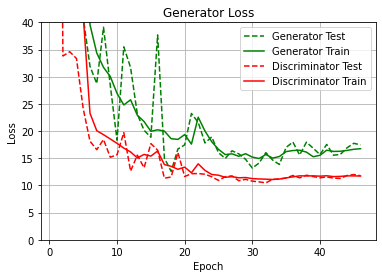

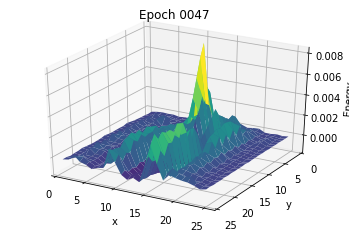

Epoch 48 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 16.11 | 12.14           | 1.42 | 2.56 
generator (test)       | 15.85 | 12.04           | 1.34 | 2.47 
discriminator (train)  | 11.62 | 2.06            | 8.28 | 1.28 
discriminator (test)   | 11.44 | 2.05            | 8.22 | 1.17 


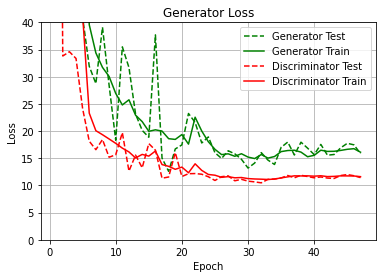

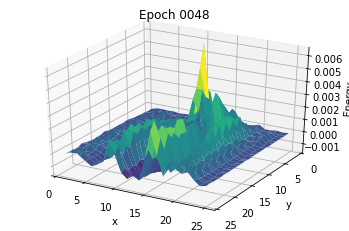

Epoch 49 of 100
140/140 [==============================] - 156s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.99 | 12.33           | 1.42 | 2.24 
generator (test)       | 17.02 | 13.73           | 1.22 | 2.07 
discriminator (train)  | 11.42 | 2.03            | 8.27 | 1.12 
discriminator (test)   | 11.29 | 2.16            | 8.08 | 1.05 


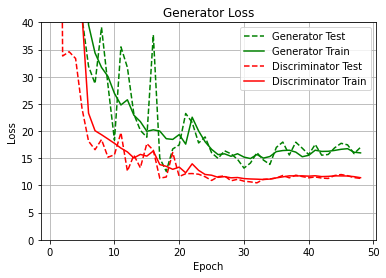

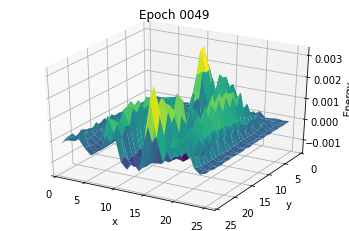

Epoch 50 of 100
140/140 [==============================] - 156s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.79 | 12.22           | 1.42 | 2.15 
generator (test)       | 14.95 | 11.62           | 1.43 | 1.90 
discriminator (train)  | 11.37 | 2.03            | 8.24 | 1.10 
discriminator (test)   | 11.07 | 2.04            | 8.06 | 0.97 


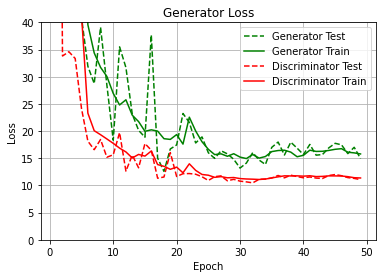

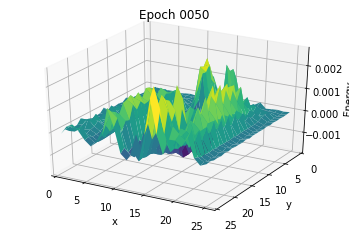

Epoch 51 of 100
140/140 [==============================] - 160s 1s/step
Time for Epoch: 00:02:45
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.57 | 12.14           | 1.37 | 2.06 
generator (test)       | 15.90 | 12.65           | 1.38 | 1.87 
discriminator (train)  | 11.23 | 2.00            | 8.22 | 1.02 
discriminator (test)   | 10.96 | 1.98            | 8.05 | 0.93 


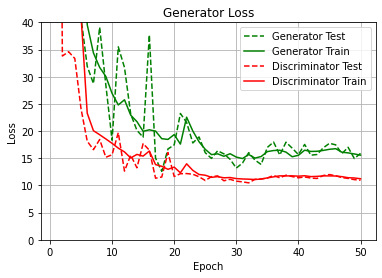

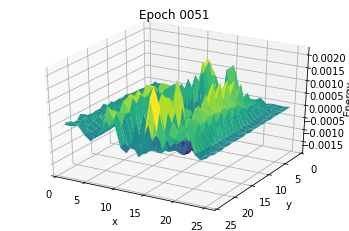

Epoch 52 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.08 | 11.91           | 1.38 | 1.79 
generator (test)       | 14.73 | 11.61           | 1.28 | 1.83 
discriminator (train)  | 11.18 | 2.05            | 8.23 | 0.90 
discriminator (test)   | 11.12 | 2.14            | 8.05 | 0.93 


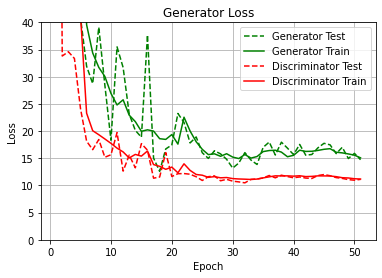

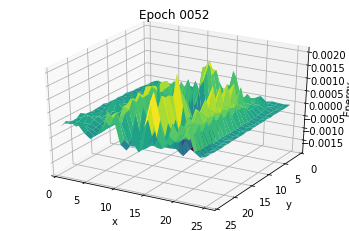

Epoch 53 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.04 | 11.98           | 1.37 | 1.69 
generator (test)       | 13.85 | 11.14           | 1.31 | 1.40 
discriminator (train)  | 11.11 | 2.07            | 8.20 | 0.84 
discriminator (test)   | 10.81 | 2.05            | 8.04 | 0.73 


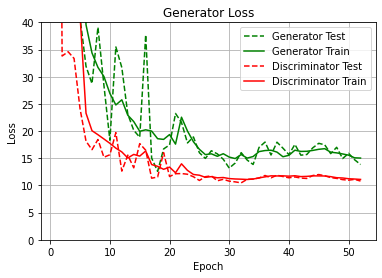

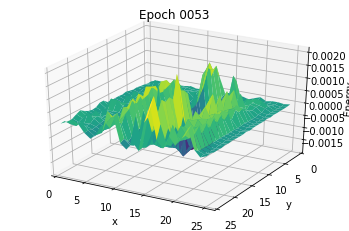

Epoch 54 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 14.88 | 11.97           | 1.43 | 1.48 
generator (test)       | 14.05 | 11.42           | 1.33 | 1.30 
discriminator (train)  | 11.03 | 2.06            | 8.23 | 0.74 
discriminator (test)   | 10.60 | 1.86            | 8.09 | 0.65 


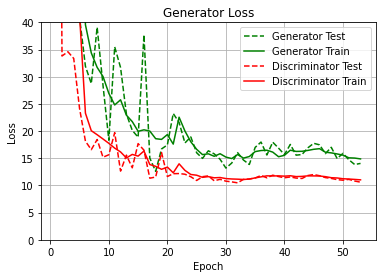

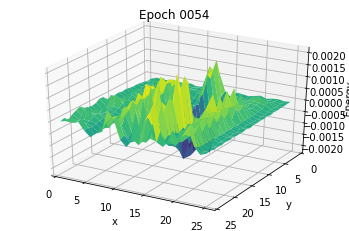

Epoch 55 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.17 | 12.22           | 1.55 | 1.40 
generator (test)       | 15.38 | 12.15           | 1.87 | 1.36 
discriminator (train)  | 11.12 | 2.10            | 8.33 | 0.69 
discriminator (test)   | 11.00 | 2.01            | 8.29 | 0.70 


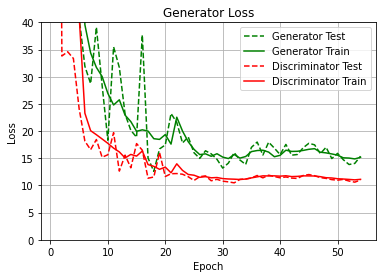

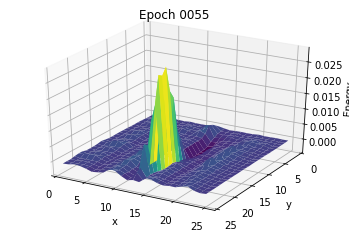

Epoch 56 of 100
140/140 [==============================] - 164s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.54 | 12.55           | 1.76 | 1.23 
generator (test)       | 14.65 | 11.88           | 1.67 | 1.09 
discriminator (train)  | 11.17 | 2.09            | 8.45 | 0.63 
discriminator (test)   | 10.97 | 2.10            | 8.34 | 0.53 


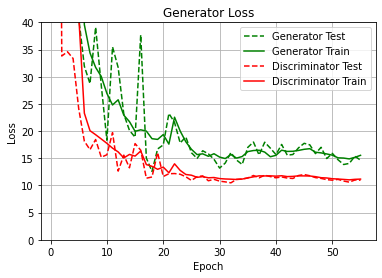

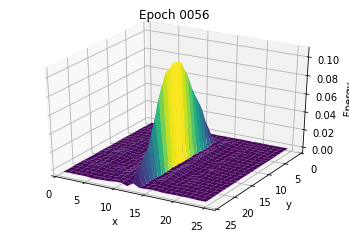

Epoch 57 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.67 | 12.83           | 1.66 | 1.18 
generator (test)       | 15.46 | 12.82           | 1.48 | 1.16 
discriminator (train)  | 11.17 | 2.13            | 8.43 | 0.61 
discriminator (test)   | 10.90 | 2.15            | 8.16 | 0.60 


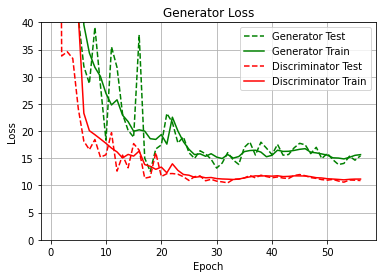

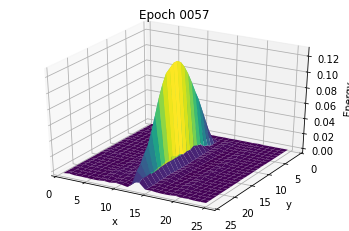

Epoch 58 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 15.24 | 12.42           | 1.61 | 1.20 
generator (test)       | 13.35 | 10.37           | 1.84 | 1.13 
discriminator (train)  | 11.18 | 2.11            | 8.46 | 0.61 
discriminator (test)   | 10.99 | 2.06            | 8.39 | 0.55 


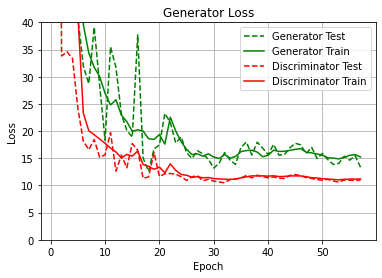

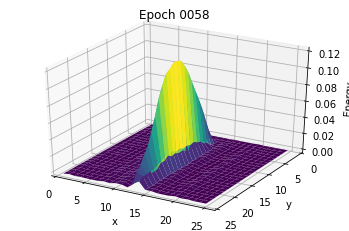

Epoch 59 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 14.40 | 11.67           | 1.76 | 0.97 
generator (test)       | 12.67 | 10.01           | 1.81 | 0.84 
discriminator (train)  | 11.28 | 2.11            | 8.69 | 0.48 
discriminator (test)   | 10.97 | 2.20            | 8.37 | 0.40 


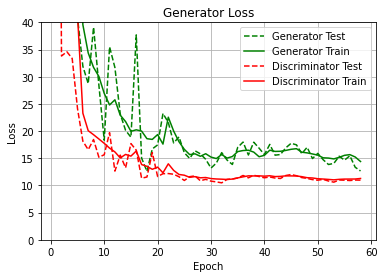

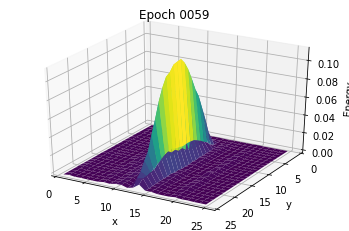

Epoch 60 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 13.58 | 10.90           | 1.81 | 0.87 
generator (test)       | 12.00 | 9.02            | 1.88 | 1.11 
discriminator (train)  | 11.36 | 2.20            | 8.73 | 0.43 
discriminator (test)   | 11.64 | 2.44            | 8.66 | 0.53 


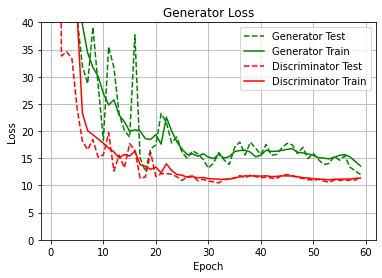

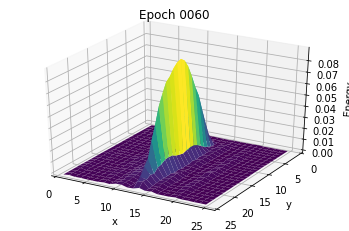

Epoch 61 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.39 | 9.50            | 1.99 | 0.90 
generator (test)       | 13.32 | 10.68           | 1.91 | 0.73 
discriminator (train)  | 11.76 | 2.36            | 8.93 | 0.47 
discriminator (test)   | 11.31 | 2.34            | 8.60 | 0.37 


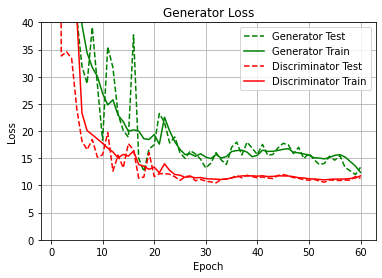

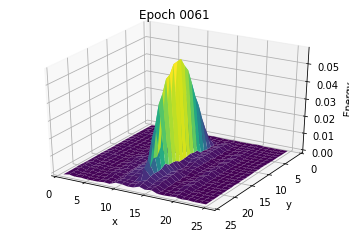

Epoch 62 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.48 | 9.51            | 2.09 | 0.88 
generator (test)       | 11.63 | 8.72            | 1.83 | 1.08 
discriminator (train)  | 11.76 | 2.40            | 8.92 | 0.44 
discriminator (test)   | 11.69 | 2.51            | 8.69 | 0.50 


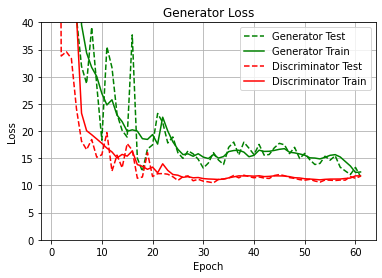

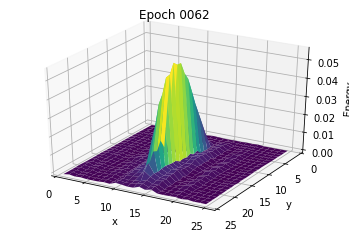

Epoch 63 of 100
140/140 [==============================] - 165s 1s/step
Time for Epoch: 00:02:51
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.28 | 9.21            | 2.12 | 0.95 
generator (test)       | 13.10 | 9.87            | 2.02 | 1.21 
discriminator (train)  | 11.75 | 2.39            | 8.88 | 0.48 
discriminator (test)   | 11.77 | 2.46            | 8.74 | 0.57 


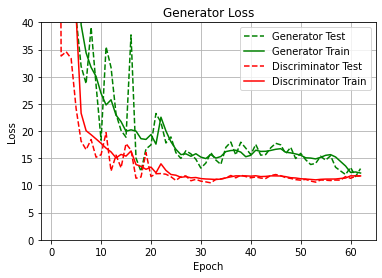

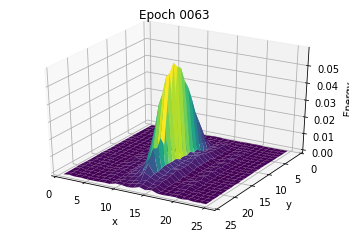

Epoch 64 of 100
140/140 [==============================] - 164s 1s/step
Time for Epoch: 00:02:50
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.13 | 9.03            | 2.13 | 0.97 
generator (test)       | 11.18 | 8.33            | 1.92 | 0.92 
discriminator (train)  | 11.86 | 2.49            | 8.88 | 0.49 
discriminator (test)   | 11.73 | 2.57            | 8.70 | 0.46 


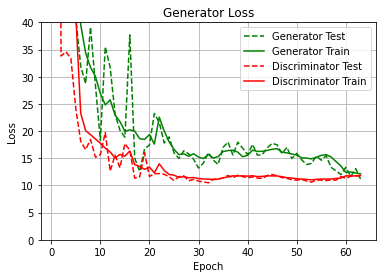

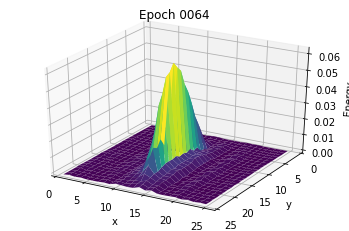

Epoch 65 of 100
140/140 [==============================] - 158s 1s/step
Time for Epoch: 00:02:43
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 11.61 | 8.57            | 2.12 | 0.93 
generator (test)       | 10.72 | 7.64            | 2.15 | 0.93 
discriminator (train)  | 11.89 | 2.54            | 8.89 | 0.47 
discriminator (test)   | 11.77 | 2.64            | 8.68 | 0.46 


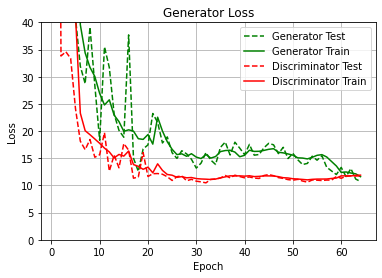

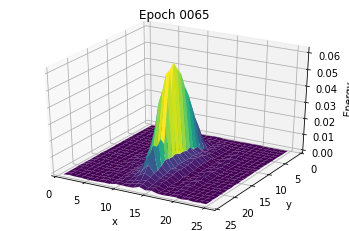

Epoch 66 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 11.56 | 8.46            | 2.13 | 0.96 
generator (test)       | 11.33 | 8.34            | 1.97 | 1.02 
discriminator (train)  | 12.04 | 2.65            | 8.91 | 0.48 
discriminator (test)   | 11.95 | 2.73            | 8.74 | 0.47 


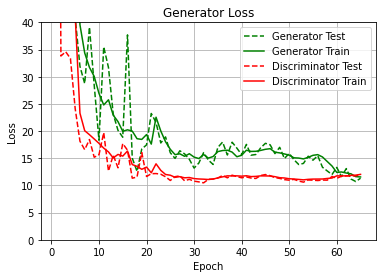

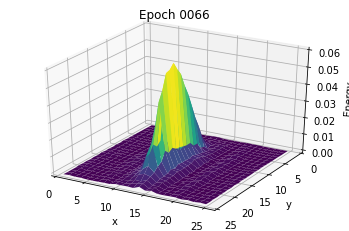

Epoch 67 of 100
140/140 [==============================] - 157s 1s/step
Time for Epoch: 00:02:42
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.08 | 8.81            | 2.26 | 1.01 
generator (test)       | 12.80 | 9.62            | 2.21 | 0.97 
discriminator (train)  | 12.09 | 2.61            | 8.98 | 0.50 
discriminator (test)   | 11.82 | 2.52            | 8.81 | 0.48 


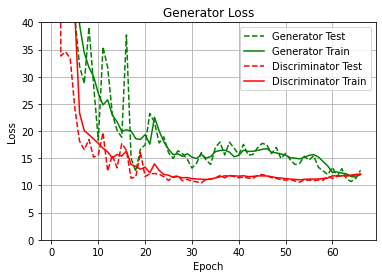

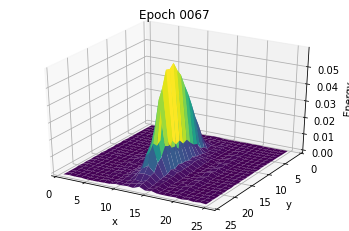

Epoch 68 of 100
140/140 [==============================] - 157s 1s/step
Time for Epoch: 00:02:42
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 11.96 | 8.62            | 2.28 | 1.06 
generator (test)       | 12.39 | 8.61            | 2.75 | 1.03 
discriminator (train)  | 12.17 | 2.59            | 9.06 | 0.53 
discriminator (test)   | 12.10 | 2.46            | 9.11 | 0.53 


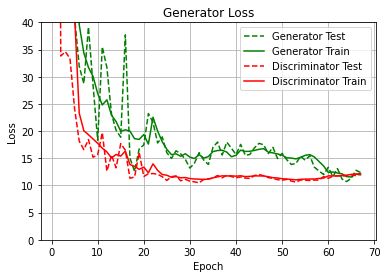

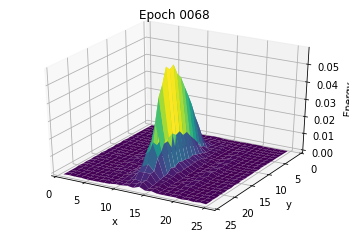

Epoch 69 of 100
140/140 [==============================] - 156s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.11 | 8.73            | 2.31 | 1.07 
generator (test)       | 12.98 | 9.86            | 2.11 | 1.01 
discriminator (train)  | 12.27 | 2.61            | 9.13 | 0.54 
discriminator (test)   | 12.21 | 2.62            | 9.04 | 0.55 


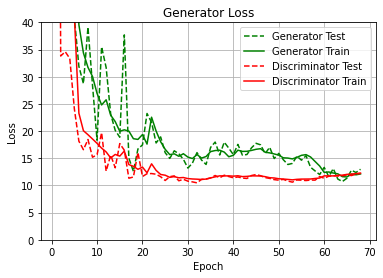

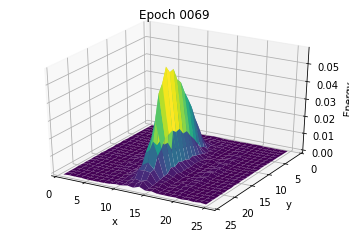

Epoch 70 of 100
140/140 [==============================] - 156s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.22 | 8.83            | 2.31 | 1.07 
generator (test)       | 12.79 | 8.73            | 2.97 | 1.09 
discriminator (train)  | 12.28 | 2.62            | 9.13 | 0.53 
discriminator (test)   | 12.03 | 2.50            | 9.01 | 0.52 


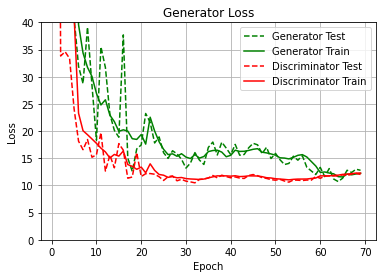

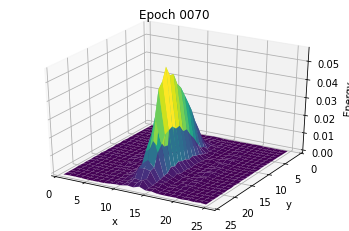

Epoch 71 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:40
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.28 | 8.81            | 2.39 | 1.07 
generator (test)       | 14.07 | 10.70           | 2.28 | 1.09 
discriminator (train)  | 12.34 | 2.61            | 9.19 | 0.54 
discriminator (test)   | 11.93 | 2.47            | 8.88 | 0.58 


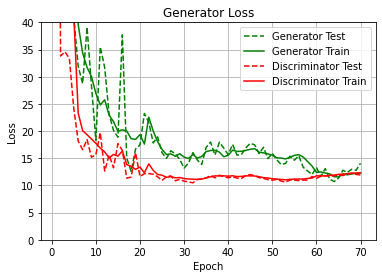

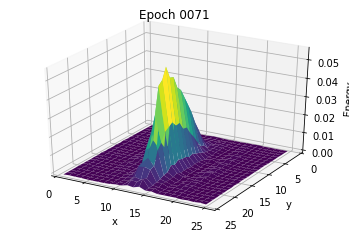

Epoch 72 of 100
140/140 [==============================] - 156s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.20 | 8.78            | 2.34 | 1.08 
generator (test)       | 11.33 | 7.90            | 2.39 | 1.04 
discriminator (train)  | 12.35 | 2.59            | 9.21 | 0.55 
discriminator (test)   | 12.05 | 2.58            | 8.95 | 0.52 


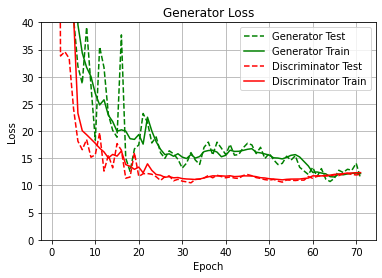

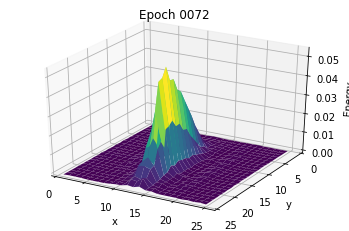

Epoch 73 of 100
140/140 [==============================] - 156s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.22 | 8.73            | 2.35 | 1.14 
generator (test)       | 11.86 | 8.37            | 2.33 | 1.15 
discriminator (train)  | 12.43 | 2.65            | 9.21 | 0.57 
discriminator (test)   | 12.25 | 2.61            | 9.08 | 0.56 


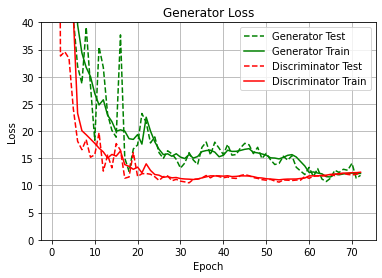

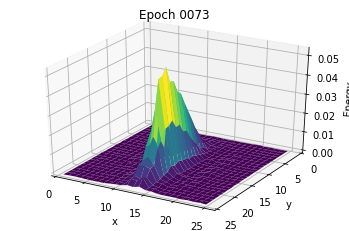

Epoch 74 of 100
140/140 [==============================] - 157s 1s/step
Time for Epoch: 00:02:42
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.43 | 8.76            | 2.48 | 1.19 
generator (test)       | 12.16 | 8.36            | 2.58 | 1.22 
discriminator (train)  | 12.56 | 2.64            | 9.32 | 0.60 
discriminator (test)   | 12.49 | 2.69            | 9.22 | 0.58 


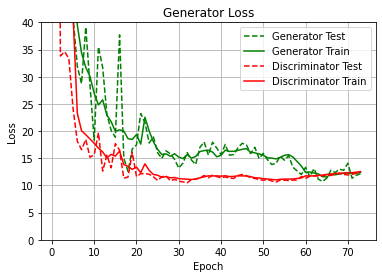

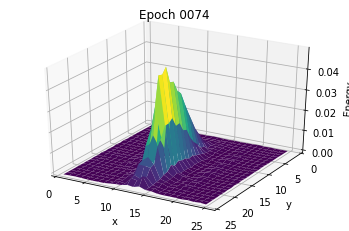

Epoch 75 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.51 | 8.93            | 2.37 | 1.21 
generator (test)       | 12.24 | 8.52            | 2.45 | 1.27 
discriminator (train)  | 12.50 | 2.62            | 9.28 | 0.60 
discriminator (test)   | 12.15 | 2.52            | 8.98 | 0.64 


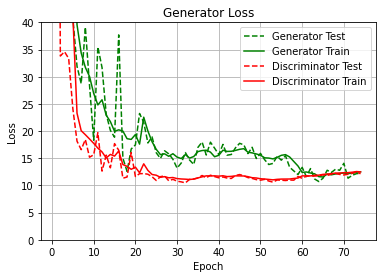

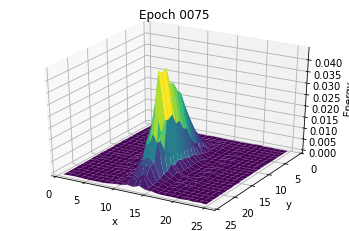

Epoch 76 of 100
140/140 [==============================] - 156s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.41 | 8.82            | 2.37 | 1.21 
generator (test)       | 12.38 | 9.07            | 2.08 | 1.23 
discriminator (train)  | 12.52 | 2.65            | 9.26 | 0.61 
discriminator (test)   | 12.17 | 2.61            | 8.92 | 0.64 


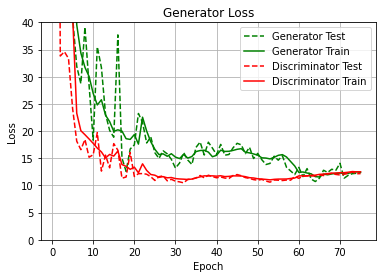

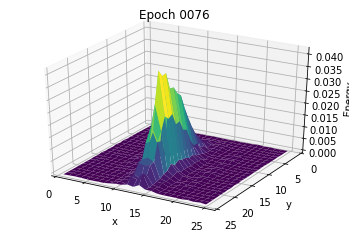

Epoch 77 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.85 | 9.26            | 2.36 | 1.24 
generator (test)       | 13.74 | 9.82            | 2.61 | 1.31 
discriminator (train)  | 12.44 | 2.54            | 9.27 | 0.63 
discriminator (test)   | 12.50 | 2.62            | 9.24 | 0.64 


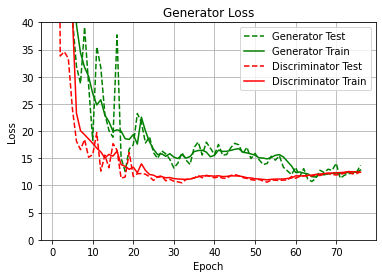

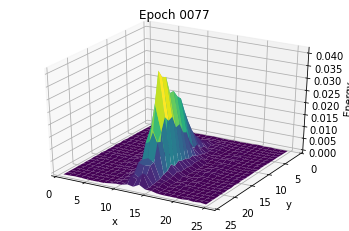

Epoch 78 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:40
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.99 | 9.34            | 2.41 | 1.24 
generator (test)       | 15.14 | 11.42           | 2.56 | 1.15 
discriminator (train)  | 12.37 | 2.52            | 9.23 | 0.62 
discriminator (test)   | 12.01 | 2.42            | 9.01 | 0.57 


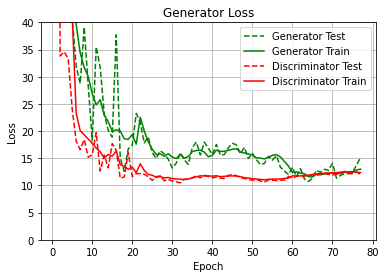

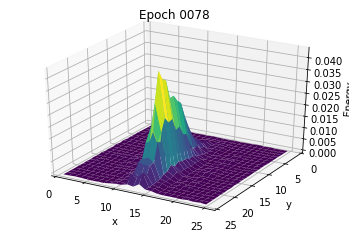

Epoch 79 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.80 | 9.18            | 2.40 | 1.23 
generator (test)       | 12.44 | 8.80            | 2.39 | 1.25 
discriminator (train)  | 12.29 | 2.49            | 9.19 | 0.61 
discriminator (test)   | 12.20 | 2.56            | 9.03 | 0.61 


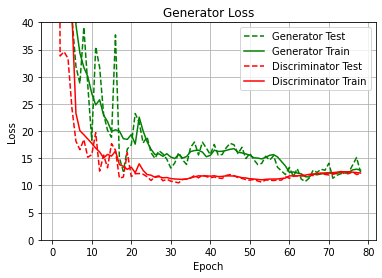

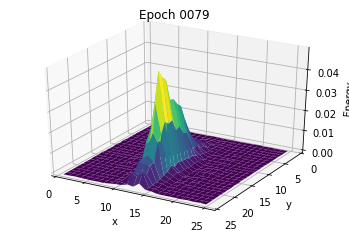

Epoch 80 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.30 | 8.71            | 2.48 | 1.11 
generator (test)       | 10.48 | 6.84            | 2.58 | 1.06 
discriminator (train)  | 12.84 | 2.81            | 9.47 | 0.57 
discriminator (test)   | 12.79 | 3.06            | 9.22 | 0.52 


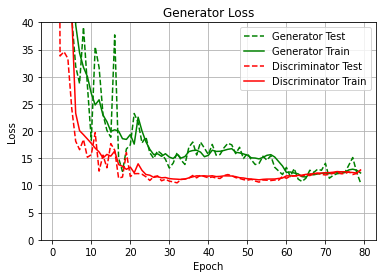

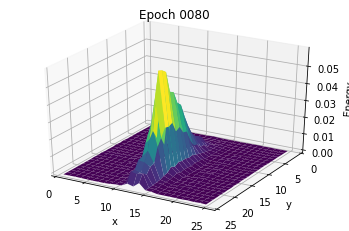

Epoch 81 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 11.21 | 7.77            | 2.46 | 0.98 
generator (test)       | 10.82 | 7.48            | 2.41 | 0.94 
discriminator (train)  | 12.78 | 2.99            | 9.31 | 0.48 
discriminator (test)   | 12.85 | 3.10            | 9.26 | 0.49 


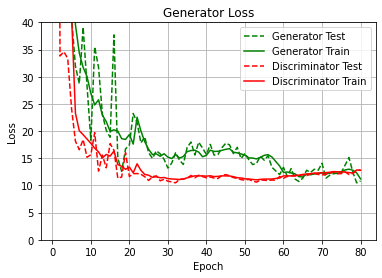

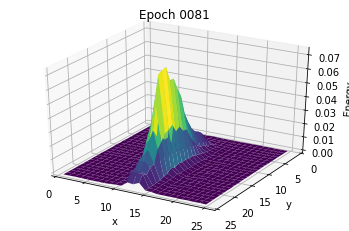

Epoch 82 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 11.14 | 7.75            | 2.42 | 0.98 
generator (test)       | 11.49 | 8.02            | 2.47 | 0.99 
discriminator (train)  | 12.84 | 2.99            | 9.36 | 0.49 
discriminator (test)   | 12.71 | 3.00            | 9.18 | 0.52 


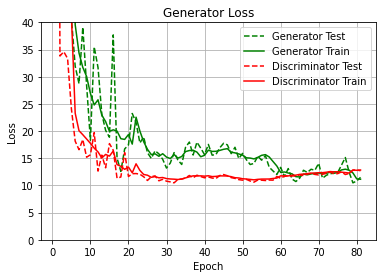

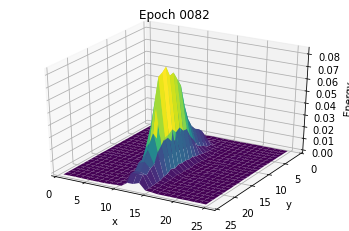

Epoch 83 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 11.92 | 8.49            | 2.37 | 1.06 
generator (test)       | 12.76 | 9.08            | 2.63 | 1.05 
discriminator (train)  | 12.52 | 2.70            | 9.29 | 0.53 
discriminator (test)   | 12.58 | 2.71            | 9.36 | 0.51 


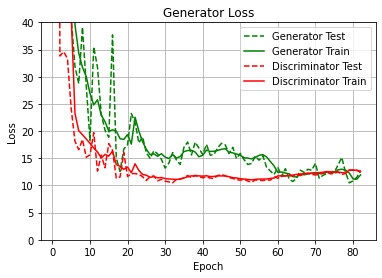

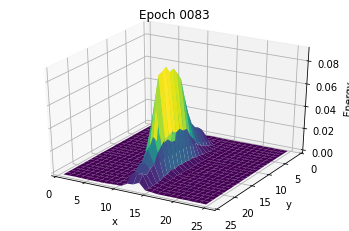

Epoch 84 of 100
140/140 [==============================] - 156s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.55 | 8.99            | 2.43 | 1.13 
generator (test)       | 12.44 | 9.00            | 2.32 | 1.11 
discriminator (train)  | 12.44 | 2.61            | 9.27 | 0.56 
discriminator (test)   | 12.20 | 2.55            | 9.08 | 0.57 


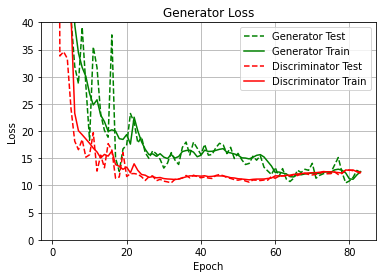

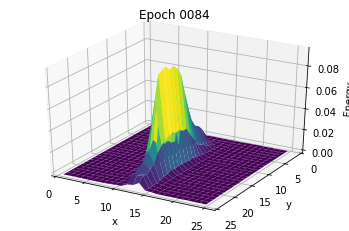

Epoch 85 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:40
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 13.04 | 9.39            | 2.43 | 1.23 
generator (test)       | 14.61 | 11.29           | 2.15 | 1.17 
discriminator (train)  | 12.49 | 2.56            | 9.33 | 0.60 
discriminator (test)   | 12.49 | 2.63            | 9.24 | 0.62 


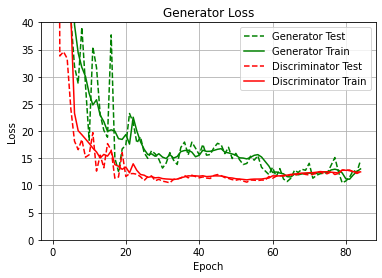

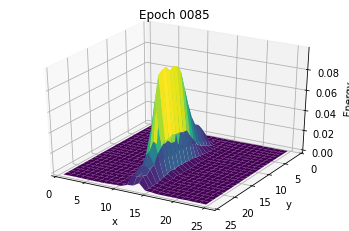

Epoch 86 of 100
140/140 [==============================] - 157s 1s/step
Time for Epoch: 00:02:42
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 13.26 | 9.61            | 2.43 | 1.23 
generator (test)       | 13.37 | 9.58            | 2.64 | 1.15 
discriminator (train)  | 12.48 | 2.50            | 9.36 | 0.61 
discriminator (test)   | 12.35 | 2.58            | 9.16 | 0.60 


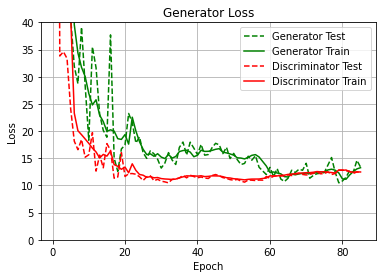

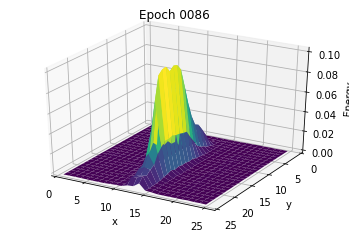

Epoch 87 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:40
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 13.29 | 9.70            | 2.35 | 1.25 
generator (test)       | 12.93 | 9.39            | 2.34 | 1.20 
discriminator (train)  | 12.57 | 2.53            | 9.42 | 0.62 
discriminator (test)   | 12.41 | 2.57            | 9.19 | 0.65 


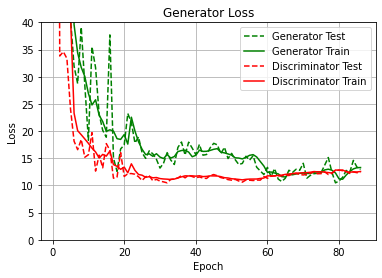

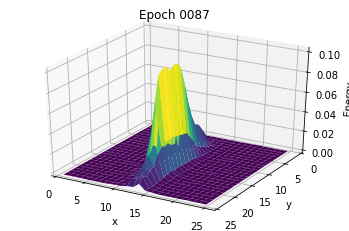

Epoch 88 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 13.44 | 9.71            | 2.48 | 1.25 
generator (test)       | 13.39 | 9.22            | 2.88 | 1.30 
discriminator (train)  | 12.46 | 2.51            | 9.34 | 0.60 
discriminator (test)   | 12.57 | 2.66            | 9.27 | 0.64 


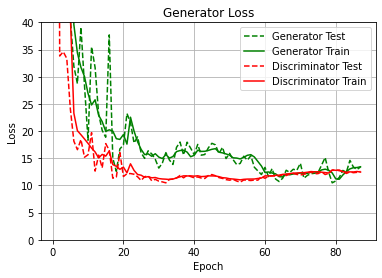

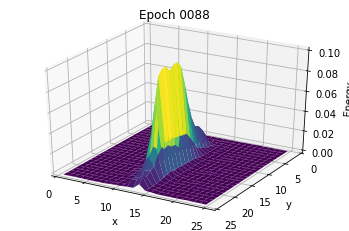

Epoch 89 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 13.71 | 9.96            | 2.48 | 1.26 
generator (test)       | 13.21 | 9.26            | 2.70 | 1.25 
discriminator (train)  | 12.41 | 2.45            | 9.34 | 0.63 
discriminator (test)   | 12.39 | 2.43            | 9.35 | 0.61 


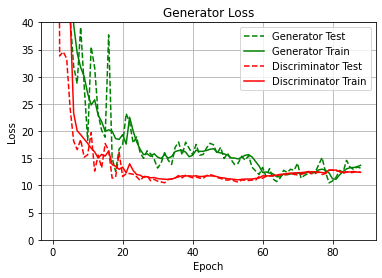

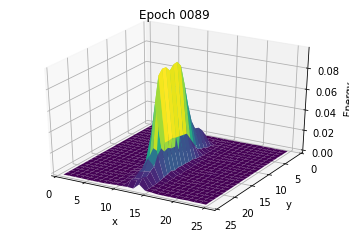

Epoch 90 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:40
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 13.49 | 9.76            | 2.47 | 1.26 
generator (test)       | 13.88 | 10.11           | 2.47 | 1.30 
discriminator (train)  | 12.49 | 2.42            | 9.43 | 0.64 
discriminator (test)   | 12.31 | 2.42            | 9.26 | 0.64 


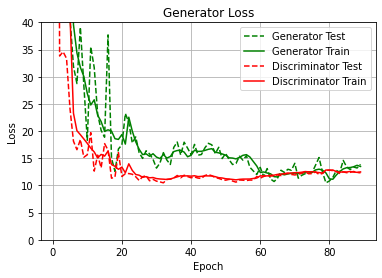

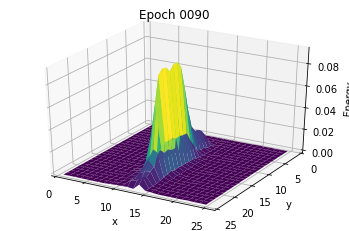

Epoch 91 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 13.33 | 9.56            | 2.49 | 1.28 
generator (test)       | 14.36 | 10.46           | 2.55 | 1.35 
discriminator (train)  | 12.52 | 2.44            | 9.44 | 0.64 
discriminator (test)   | 12.32 | 2.38            | 9.28 | 0.66 


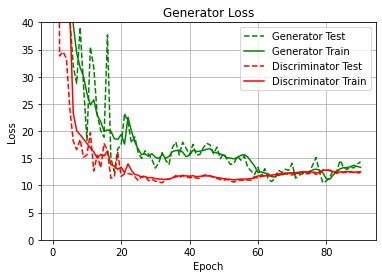

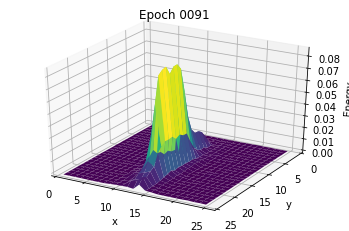

Epoch 92 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 13.33 | 9.52            | 2.51 | 1.30 
generator (test)       | 12.89 | 9.04            | 2.53 | 1.32 
discriminator (train)  | 12.53 | 2.46            | 9.42 | 0.64 
discriminator (test)   | 12.47 | 2.57            | 9.26 | 0.64 


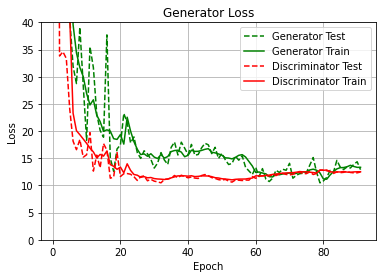

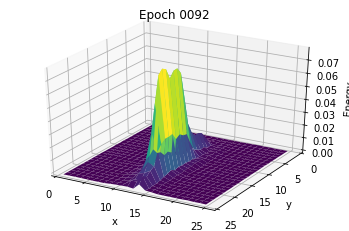

Epoch 93 of 100
140/140 [==============================] - 156s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 13.14 | 9.27            | 2.57 | 1.30 
generator (test)       | 13.09 | 9.40            | 2.42 | 1.26 
discriminator (train)  | 12.65 | 2.57            | 9.43 | 0.65 
discriminator (test)   | 12.88 | 2.86            | 9.36 | 0.67 


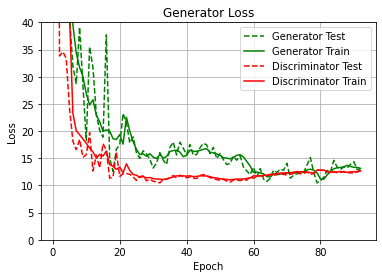

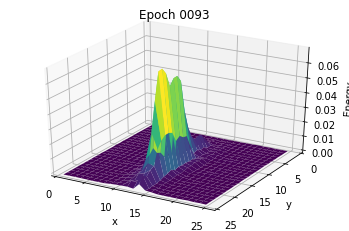

Epoch 94 of 100
140/140 [==============================] - 158s 1s/step
Time for Epoch: 00:02:43
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 12.27 | 8.38            | 2.60 | 1.29 
generator (test)       | 11.59 | 7.86            | 2.50 | 1.23 
discriminator (train)  | 12.84 | 2.73            | 9.47 | 0.64 
discriminator (test)   | 12.71 | 2.78            | 9.31 | 0.63 


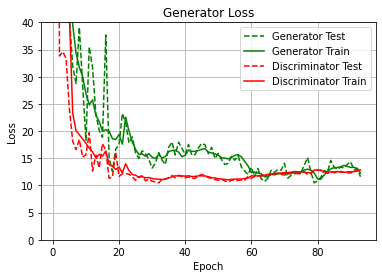

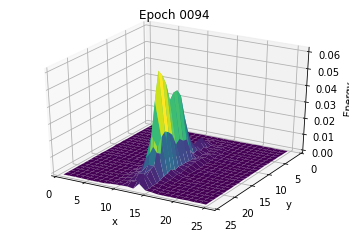

Epoch 95 of 100
140/140 [==============================] - 156s 1s/step
Time for Epoch: 00:02:42
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 11.47 | 7.69            | 2.53 | 1.26 
generator (test)       | 11.20 | 6.97            | 3.00 | 1.23 
discriminator (train)  | 12.94 | 2.87            | 9.42 | 0.65 
discriminator (test)   | 12.85 | 3.06            | 9.18 | 0.61 


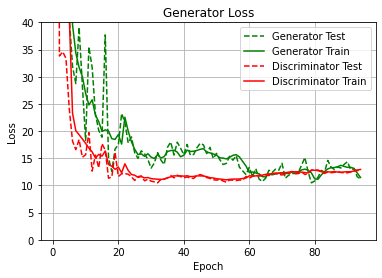

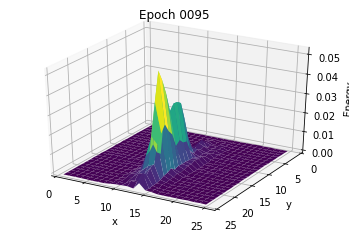

Epoch 96 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:40
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 11.04 | 7.28            | 2.54 | 1.22 
generator (test)       | 10.57 | 6.94            | 2.45 | 1.19 
discriminator (train)  | 12.97 | 3.02            | 9.33 | 0.61 
discriminator (test)   | 12.93 | 3.13            | 9.20 | 0.61 


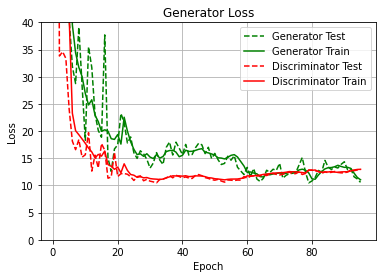

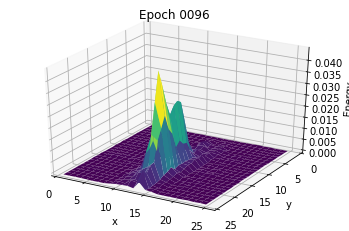

Epoch 97 of 100
140/140 [==============================] - 156s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 10.98 | 7.28            | 2.49 | 1.21 
generator (test)       | 11.52 | 7.75            | 2.55 | 1.22 
discriminator (train)  | 13.03 | 3.10            | 9.34 | 0.60 
discriminator (test)   | 12.79 | 3.12            | 9.06 | 0.61 


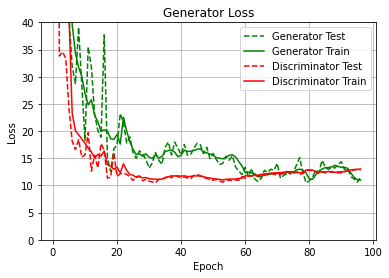

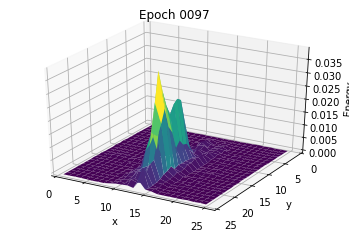

Epoch 98 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:40
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 11.08 | 7.44            | 2.48 | 1.15 
generator (test)       | 11.14 | 7.36            | 2.60 | 1.18 
discriminator (train)  | 12.91 | 3.05            | 9.27 | 0.59 
discriminator (test)   | 12.78 | 3.09            | 9.12 | 0.57 


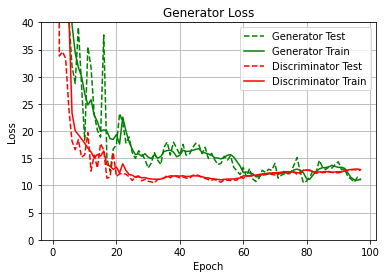

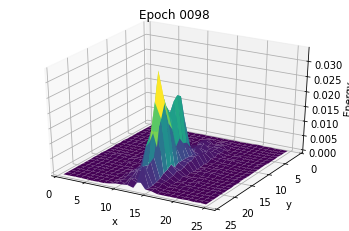

Epoch 99 of 100
140/140 [==============================] - 155s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 11.06 | 7.48            | 2.43 | 1.15 
generator (test)       | 11.42 | 7.83            | 2.38 | 1.22 
discriminator (train)  | 13.00 | 3.08            | 9.33 | 0.59 
discriminator (test)   | 12.75 | 3.12            | 9.06 | 0.58 


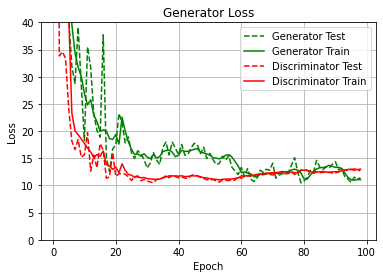

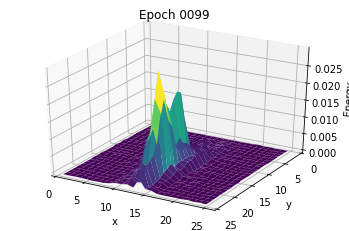

Epoch 100 of 100
140/140 [==============================] - 156s 1s/step
Time for Epoch: 00:02:41
component              | total_loss | fake/true_loss  | AUX_loss| ECAL_loss
-----------------------------------------------------------------
generator (train)      | 11.10 | 7.48            | 2.45 | 1.17 
generator (test)       | 10.99 | 7.45            | 2.40 | 1.14 
discriminator (train)  | 12.93 | 3.05            | 9.30 | 0.58 
discriminator (test)   | 12.64 | 2.98            | 9.07 | 0.58 


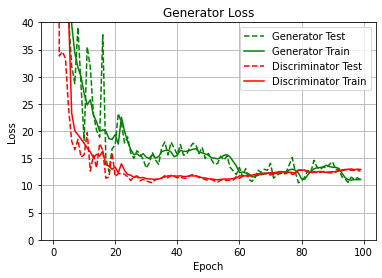

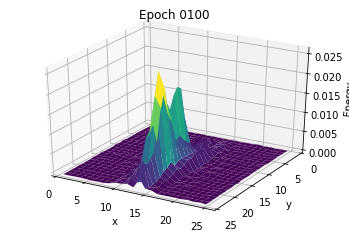

In [34]:
#training
verbose = 'true'
print("Number of Batches: ", int(X_train.shape[0] / batch_size))

train_history = defaultdict(list)   #create a dict with an empty list 
test_history = defaultdict(list)

start_epoch = 1  #i am starting training at epoch 1
for epoch in range(start_epoch + 1, nb_epochs + 1):
    print('Epoch {} of {}'.format(epoch, nb_epochs))
    start_epoch = time.time()
    lr = l_dec(epoch)
    print("Learnrate: ", lr)
    optimizer = tf.optimizers.Adam(lr)
    nb_batches = int(X_train.shape[0] / batch_size)
    if verbose:
        progress_bar = tf.keras.utils.Progbar(target=nb_batches)
    
    nb_batches = int(X_train.shape[0] / batch_size)
    
    ################################################################################
    #loop over epochs
    epoch_gen_loss = []
    epoch_disc_loss = []
    for batch in range(nb_batches):
        if verbose:
            progress_bar.update(batch+1)
        else:
            if epoch % 100 == 0:
                print('processed {}/{} batches'.format(batch + 1, nb_batches))
       
        #create batches
        image_batch  = X_train[(batch*batch_size) : ((batch+1)*batch_size)]
        energy_batch = y_train[(batch*batch_size) : ((batch+1)*batch_size)]
        ecal_batch   = ecal_train[(batch*batch_size) : ((batch+1)*batch_size)]
        
        #loss discriminator
        with tf.GradientTape() as tape:
            discriminator_true = discriminator(image_batch, g_weights, d_weights)
            d_loss = disc_loss(discriminator_true, energy_batch, ecal_batch, g_weights, d_weights, batch_size)
            grads = tape.gradient( d_loss[0] , d_weights )
        optimizer.apply_gradients( zip( grads , d_weights ) )
        epoch_disc_loss.append([d_loss[0].numpy(), d_loss[1].numpy(), d_loss[2].numpy(), d_loss[3].numpy()])  

        #generator loss
        gen_losses = []
        for i in range(1):
            with tf.GradientTape() as tape:
                g_loss = gen_loss(g_weights, d_weights, batch_size)
                grads = tape.gradient( g_loss , g_weights )
            optimizer.apply_gradients( zip( grads , g_weights ) )
            gen_losses.append([g_loss[0].numpy(), g_loss[1].numpy(), g_loss[2].numpy(), g_loss[3].numpy()])
        epoch_gen_loss.append(np.mean(gen_losses, axis = 0))

    ################################################################################
    #testing
    nb_batches = int(X_test.shape[0] / batch_size)
    if nb_batches == 0:  #I need this or I get an error if I reduce the data with percentage
        nb_batches = 1
    disc_test_loss_list = []
    gen_test_loss_list = []
    for batch in range(nb_batches):
        #create batches
        image_batch  = X_test[(batch*batch_size) : ((batch+1)*batch_size)]
        energy_batch = y_test[(batch*batch_size) : ((batch+1)*batch_size)]
        ecal_batch   = ecal_test[(batch*batch_size) : ((batch+1)*batch_size)]

        discriminator_true = discriminator(image_batch, g_weights, d_weights)
        disc_test_loss = disc_loss(discriminator_true, energy_batch, ecal_batch, g_weights, d_weights, batch_size)
        disc_test_loss_list.append([disc_test_loss[0].numpy(), disc_test_loss[1].numpy(), disc_test_loss[2].numpy(), disc_test_loss[3].numpy()])

        gen_test_loss = gen_loss(g_weights, d_weights, batch_size)
        gen_test_loss_list.append([gen_test_loss[0].numpy(), gen_test_loss[1].numpy(), gen_test_loss[2].numpy(), gen_test_loss[3].numpy()])

    
    #loss dict
    discriminator_train_loss = np.mean(np.array(epoch_disc_loss), axis=0)   #mean disc loss for all epochs
    generator_train_loss = np.mean(np.array(epoch_gen_loss), axis=0)
    discriminator_test_loss = np.mean(np.array(disc_test_loss_list), axis=0)
    generator_test_loss = np.mean(np.array(gen_test_loss_list), axis=0)
    
    train_history['generator'].append(generator_train_loss)
    train_history['discriminator'].append(discriminator_train_loss)
    test_history['generator'].append(generator_test_loss)
    test_history['discriminator'].append(discriminator_test_loss)
    end_d = time.time()
    
    #time for epoch
    end_batch = time.time()
    e = int(end_batch-start_epoch)
    print('Time for Epoch: {:02d}:{:02d}:{:02d}'.format(e // 3600, (e % 3600 // 60), e % 60))
    
    #print and plot loss 
    loss_table(train_history, test_history)
    plot_loss(train_history, test_history)
    
    #dump data
    pickle.dump(d_weights, open(save_folder + "/Weights/disc/disc_weights_"+ str(epoch) + ".p", "wb"))
    pickle.dump(g_weights, open(save_folder + "/Weights/gen/gen_weights_" + str(epoch) + ".p", "wb"))
    pickle.dump([train_history, test_history], open(save_folder+'/Pickle/3dgan-history.pkl', 'wb'))  #my history
    pickle.dump({'train': train_history, 'test': test_history}, open(save_folder+'/Pickle/3dgan-history_dict.pkl', 'wb')) #for validation script

    #plot of generated image
    plot_gen_image_tf(latent_size, g_weights)
    


In [35]:
error

NameError: name 'error' is not defined

## Validation


In [ ]:
#import pickle history
import pickle
pickle_import = pickle.load( open( '/eos/home-f/frehm/TF2/Skripts/F02-03/Runs/run11/run11/Pickle/3dgan-history.pkl', "rb" ) )
#print((pickle_import))
train_history = pickle_import[0]
test_history  = pickle_import[1]

In [ ]:
#load weights
load_epoch = 1
d_weights = pickle.load( open(save_folder + "/Weights/disc/disc_weights_"+ str(load_epoch) + ".p", "rb") )
g_weights = pickle.load( open(save_folder + "/Weights/gen/gen_weights_"+ str(load_epoch) + ".p", "rb") )

In [ ]:
#plot loss graph
plot_loss(train_history, test_history)

In [ ]:
#print table
loss_table(train_history,test_history)

In [ ]:
#plot a trainingsimage

#this is for 3D projection
#%matplotlib notebook
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  #I need this for my plot

#plot some training images
plot_images(X, 0, save_folder, save=False, number=1)

In [ ]:
#plot of generated image
plot_gen_image_tf(latent_size, g_weights)

In [ ]:
error

In [ ]:
#save weights
#pickle.dump( d_weights, open( "d_weights.p", "wb" ) )